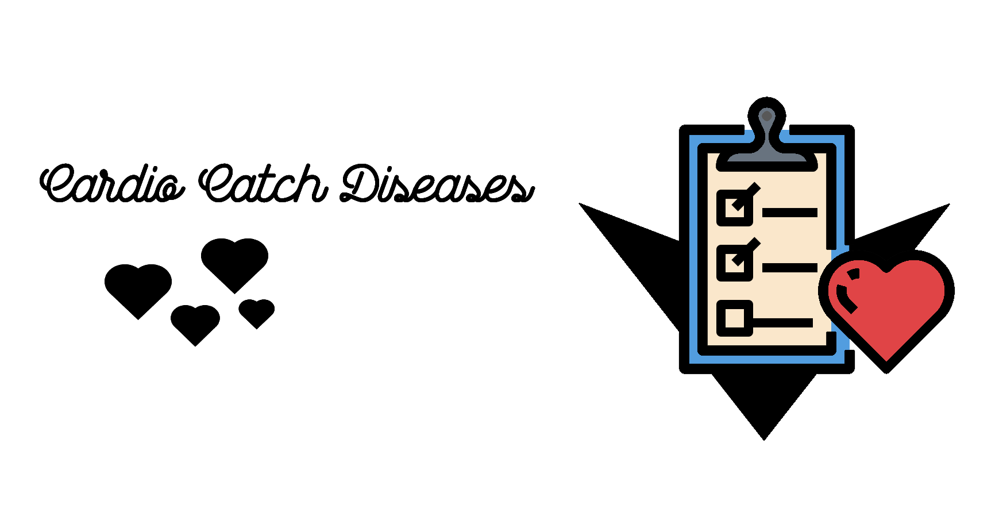

In [3]:
Image("../img/cardio2.png")

<p style="text-align:center"><i>Cadio Catch Diseases is a company specializing in early-stage heart disease detection. Its business model is of the service type, that is, the company offers the early diagnosis of a cardiovascular disease for a certain price.</i></p>

**Bussiness Context**<br>

Currently, the diagnosis of a cardiovascular disease is done manually by a team of specialists. The current accuracy of the diagnosis varies between 55% and 65%, due to the complexity of the diagnosis and also to the fatigue of the team that takes turns to minimize the risks. The cost of each diagnosis, including the equipment and the analysts' payroll, is around R$ 1,000.00.

1. *With a Model, get a better precison on cardiovascular diagnosis.*
2. *What is the precision and accuracy of this new tool?*
3. *How mutch profit the Cardio Catch Diseases will earn with this new tool?* 
4. *What is the confidence interval of this new tool?*

**What is a Cardiovascular Diseases ?**

Cardiovascular Diseases (CVD's) are a group of disorders of the heart and blood vessels.

Heart attacks and strokes are usually acute events and are mainly caused by a blockage that prevents blood from flowing to the heart or brain. The most common reason for this is a build-up of fatty deposits on the inner walls of the blood vessels that supply the heart or brain.

The most important behavioural risk factors of heart disease and stroke are unhealthy diet, physical inactivity, tobacco use and harmful use of alcohol. The effects of behavioural risk factors may show up in individuals as raised blood pressure, raised blood glucose, raised blood lipids, and overweight and obesity. These “intermediate risks factors” can be measured in primary care facilities and indicate an increased risk of heart attack, stroke, heart failure and other complications.

In addition, drug treatment of hypertension, diabetes and high blood lipids are necessary to reduce cardiovascular risk and prevent heart attacks and strokes among people with these conditions.

More Detail at: <a href='https://github.com/xGabrielR/Cardio-Catch-Diseases'>Project Documentation</a>

<font color="red">**Second Cycle**</font>

1. Full Dataset Train Test. (-)
2. Drop Features Train Test. (-)
3. Isolation Forest Test for Outliers. (-)
4. Dataset Balance.
    - Smoteen.
    - Smotetomeklinks.

## 0.1. Imports

In [1]:
import math
import pickle
import warnings
import numpy   as np
import pandas  as pd
import seaborn as sns
import plotly.express as px

from scipy import stats  as ss
import matplotlib.pyplot as plt
from sklearn.svm import SVC

from random import choices

from sklearn.utils import resample
from random import choice
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from imblearn.combine import SMOTEENN, SMOTETomek 
from IPython.display import Image
from pandas.plotting import scatter_matrix
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, IsolationForest
from sklearn.preprocessing import RobustScaler, MinMaxScaler
from sklearn.linear_model import SGDClassifier
from scikitplot.metrics import plot_confusion_matrix, plot_calibration_curve, plot_cumulative_gain
from sklearn.metrics import accuracy_score, precision_score, recall_score, cohen_kappa_score, f1_score, roc_curve, roc_auc_score
from sklearn.calibration import CalibratedClassifierCV
from sklearn.calibration import calibration_curve

C:\Users\T-Gamer\.AArep\Cardio-Catch-Diseases\lib\site-packages\xgboost\compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


## 0.2. Aux Functions

In [7]:
warnings.filterwarnings('ignore')

plt.rcParams['figure.figsize'] = [15, 10]
plt.rcParams['font.size'] = 10

palette = sns.diverging_palette(359, 359, n=5, s=999, l=50, center='dark')

def simple_metrics(df, proportion=.2, with_trim=True, num=False):
    num_att = df.select_dtypes(include=['int64', 'float64'])
    if num:
        return num_att
    else:
        c1 = pd.DataFrame(num_att.apply(np.mean)).T
        c2 = pd.DataFrame(num_att.apply(np.median)).T
        d1 = pd.DataFrame(num_att.apply(min)).T
        d2 = pd.DataFrame(num_att.apply(max)).T
        d3 = pd.DataFrame(num_att.apply(np.std)).T
        d4 = pd.DataFrame(num_att.apply(lambda x: x.max() - x.min())).T
        d5 = pd.DataFrame(num_att.apply(lambda x: x.skew())).T
        d6 = pd.DataFrame(num_att.apply(lambda x: x.kurtosis())).T

        m = pd.concat([d1, d2, c1, c2, d3, d4, d5, d6], axis=0).T.reset_index()

        if with_trim:
            trim_mean = pd.DataFrame(ss.trim_mean(num_att.values, proportion))
            m = pd.concat([m, trim_mean[0]], axis=1)
            m.columns = ['att', 'min', 'max', 'mean', 'median', 'std', 'range', 'skew', 'kurtosis', 'trim_mean']
            m = m[['att', 'min', 'max', 'mean', 'trim_mean', 'median', 'std', 'range', 'skew', 'kurtosis']]
            
            return m

        else:
            m.columns = ['att', 'min', 'max', 'mean', 'median', 'std', 'range', 'skew', 'kurtosis']
            m = m[['att', 'min', 'max', 'mean', 'median', 'std', 'range', 'skew', 'kurtosis']]

            return m

def args(bins=np.arange(0, 2, 1), hstep='step', lwidth=3, c='r', label='Sales', normed=False):
    return {'bins': bins, 'histtype': hstep, 'linewidth': lwidth, 'color': c, 'density': normed, 'label': label}

def args_b(color=(1, 1, 1, 0), edgecolor='red', linewidth=3):
    return {'linewidth': linewidth, 'color': color, 'edgecolor': edgecolor }

def plot_count_gender(df, aux):
    fig, ax = plt.subplots(1, 2, figsize=(10, 4))
    sns.countplot(df['cardio'], ax=ax[0], **args_b());
    sns.barplot(aux['cardio'], aux['gender'], **args_b(edgecolor='b'))
    ax[0].set_title('Count per Class');
    ax[1].set_title('Count per Gender');
    
    return None

def plot_cardio(aux1, aux2, aux3, label):
    ax1 = plt.subplot2grid((2, 2), (0, 0))
    ax2 = plt.subplot2grid((2, 2), (0, 1))
    ax3 = plt.subplot2grid((2, 2), (1, 0), colspan=2)

    ax1.bar(aux2[label], aux2['cardio'], **args_b(linewidth=2, edgecolor='b'))
    ax1.set_title('With Cardio')
    if label == 'age':
        ax1.vlines(45, 0, aux2['cardio'].max(), 'r--')
        ax1.hlines(850, 40, aux2[label].max(), 'r--')
    ax2.bar(aux3[label], aux3['cardio'], **args_b(linewidth=2, edgecolor='b'))
    ax2.set_title('Without Cardio')
    sns.barplot(aux1[label], aux1['cardio'], palette=palette, ax=ax3);
    ax3.set_title('Full Dataset');

    return None

def plot_pulse_pression(aux1, aux2, aux3):
    ax1 = plt.subplot2grid((2, 2), (0, 0))
    ax2 = plt.subplot2grid((2, 2), (0, 1))
    ax3 = plt.subplot2grid((2, 2), (1, 0), colspan=2)

    ax1.bar(aux2['age'], aux2['pulse_pressure'], **args_b(edgecolor='b'))
    ax1.set_title('With Cardio')
    ax2.bar(aux3['age'], aux3['pulse_pressure'], **args_b(edgecolor='b'))
    ax2.set_title('Without Cardio')
    sns.barplot(aux1['age'], aux1['pulse_pressure'], palette=palette, ax=ax3)
    
    return None

def plot_gluc(aux1, aux2, aux3, aux4, aux5):
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    ax[0].pie(aux1['cardio'], labels=[1, 2, 3], explode=[.14, .1, .1], colors=['k', 'b', 'r']);
    ax[0].set_title('Gluc Level');
    ax[0].legend();

    for i in zip([aux2, aux3], [aux4, aux5], ['diastolic']*2, ['systolic']*2, ['r', 'b'] ):
        ax[1].bar(i[0]['gluc'], i[0][i[2]], **args_b(edgecolor=i[4]))
        ax[2].bar(i[1]['gluc'], i[1][i[3]], **args_b(edgecolor=i[4]))
        
    for k in zip(range(1, 3), ['Gluc Level']*2, ['Diastolic', 'Systolic']):
        ax[k[0]].legend(['With Cardio', 'Without Cardio'])
        ax[k[0]].set_xlabel(k[1])
        ax[k[0]].set_ylabel(k[2])
  
    return None

def plot_hist(df, ranges):
    fig, ax = plt.subplots(ranges[0], ranges[1], figsize=(20, 30))
    ax = ax.flatten()
    for c, i in zip(df.columns.tolist(), range(len(df.columns))):
        ax[i].hist(df[c][msk], **args(bins=10, c='b', lwidth=3, label="Cardio") );
        ax[i].hist(df[c][~msk], **args(bins=10, lwidth=3, label="No Cardio"));
        ax[i].set_title(c)
        ax[i].legend()
    
    return None

def qq_plot(df, ranges):
    fig, ax = plt.subplots(ranges[0], ranges[1], figsize=(15, 25))
    ax = ax.flatten()
    for c, i in zip(df.columns.tolist(), range(len(df.columns))):
        ss.probplot(df[c], plot=ax[i]);
        plt.tight_layout(w_pad=2., h_pad=2.)
        ax[i].text(.1, .9, c, color='maroon', transform=ax[i].transAxes)
    
    return None

def get_importances(model, columns):
    aux = {}
    for k in range(len(columns)):
        aux[columns[k]] = model.feature_importances_[k]
    
    return aux

def plot_importances(model1, model2, columns):
    model1_feat = get_importances(model1, columns)
    model2_feat = get_importances(model2, columns)
    
    fig, ax = plt.subplots(2, 1, figsize=(15, 10))
    ax[0].bar(model1_feat.keys(), model1_feat.values(), **args_b(edgecolor='k'))
    ax[1].bar(model2_feat.keys(), model2_feat.values(), **args_b(edgecolor='b'))
    ax[0].set_title('Random Forest Features')
    ax[1].set_title('XGBoost Features');
    
    return None

def cumulative_gain(y_true, y_score, l):
    y_true = (y_true == l)
    
    index = np.argsort(y_score)
    y_true = y_true[index]
    
    gains = np.cumsum(y_true) / float(np.sum(y_true)) 
    percentages = np.arange(start=1, stop=len(y_true) + 1) / float(len(y_true))

    return percentages, gains

def plot_cumulative(y_true, y_probas, title='Cumulative Curve', ax=None):
    percentages, gains1 = cumulative_gain(y_true, y_probas[:, 0], 1)
    percentages, gains2 = cumulative_gain(y_true, y_probas[:, 1], 0)

    if ax is None:
        fig, ax = plt.subplots(figsize=(5, 5))

    ax.set_title(title)

    for k in zip([percentages, percentages], [gains1, gains2], ['b', 'r'], ['Class 0', 'Class 1']):
        ax.plot(k[0], k[1], lw=3, color=k[2], label=k[3])
    
    ax.plot([0, 1], [0, 1], 'k--', lw=2, label='Random')
    
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.0])

    ax.set_xlabel('Sample Size')
    ax.set_ylabel('Proportion Cardio')
    ax.grid('on')
    ax.legend(loc='lower right')

    return ax

def plot_roc(y_true, yhat_p, title="Roc Curve", ax=None, model_name="baseline", test=True):
    fpr, tpr, _ = roc_curve(y_true, yhat_p[:,1])
    
    if ax == None:
        fig, ax = plt.subplots(figsize=(5, 5))
        
    ax.set_title(title)
    
    ax.plot([0, 1], [0, 1], 'k--', label='Random')
    ax.plot(fpr, tpr, 'b', lw=3, label=f'Model {model_name}')
    
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.0])

    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.grid('on')
    ax.legend(loc="lower right")
    
    return ax

def ml_error(model_name, y_test, yhat, yhat_p=False, roc=False):
    acc = accuracy_score(y_test, yhat)
    rec = recall_score(y_test, yhat)
    pre = precision_score(y_test, yhat)
    fsc = f1_score(y_test, yhat)
    kpp = cohen_kappa_score(y_test, yhat)
    rau = roc_auc_score(y_test, yhat) 
    
    if roc:
        fig, ax = plt.subplots(1, 3, figsize=(15,5))
        plot_cumulative(y_test, yhat_p, ax=ax[0])
        plot_roc(y_test, yhat_p, ax=ax[1], model_name=model_name)
        plot_confusion_matrix(y_test, yhat, ax=ax[2])
        
    else:
         plot_confusion_matrix(y_test, yhat, figsize=(15, 5))
    
    return pd.DataFrame({'Model Name': model_name,
                           'Accuracy': acc,
                           'Precision': pre,
                           'Kappa Score': kpp,
                           'ROCAUC': rau,
                           'F1-Score':fsc}, index=[0])

def cross_validation(model, x, y, k, verb):
    kfold = StratifiedKFold(n_splits=k, shuffle=True)

    i=1
    pre_list = []
    acc_list = []

    for train_ix, val_ix in kfold.split(x, y):
        if verb:
            print(f'{i} -> {k} Cross Validation Folds')

        # Get Dataset Folders
        x_train_fold = x.iloc[train_ix]
        y_train_fold = y.iloc[train_ix]
        x_val_fold = x.iloc[val_ix]
        y_val_fold = y.iloc[val_ix]

        # Model Train 
        model = model.fit(x_train_fold, y_train_fold)
        yhat_label = model.predict(x_val_fold)
        #yhat_proba = model.predict_proba(x_val_fold)

        acc_list.append(accuracy_score(y_val_fold, yhat_label))
        pre_list.append(precision_score(y_val_fold, yhat_label))

        i+=1

    df = pd.DataFrame(columns=["Model Name", "Accuracy", "Precision"], index=[-1])
    df["Model Name"] = df["Model Name"].fillna(type(model).__name__)
    df["Accuracy"]  = str(round(np.mean(acc_list), 4)) + " + / - " + str(round(np.std(acc_list), 4)) 
    df["Precision"] = str(round(np.mean(pre_list), 4)) + " + / - " + str(round(np.std(pre_list), 4))
    
    return df.reset_index(drop=True)


def perform_bootstrap(n_inter, df, model, x_test, y_test):
    stats = []
    i = 0

    for i in range(n_inter):
        train = resample( df.values, n_samples=int(len(x) * .30))
        #test = np.array([x for x in data if x.tolist() not in train.tolist()])

        model.fit(train[:, :-1], train[:, -1])
        yhat = model.predict(x_test.values)

        acc = precision_score( y_test, yhat )
        stats.append( acc )
        i+=1
        
    return stats

def pair_plot_calibration_curve(model, y_test, yhat_probas, yhat_cali_probas):
    fig, ax = plt.subplots(figsize=(10, 7))
    ax.plot([1,0], [1,0], 'k--', label="Perfect Calibration")

    probas = [k[:, 1] for k in [yhat_probas, yhat_cali_probas]]
    for i, l in zip(probas, [' No Calibrated', ' Calibrated'] ):
        prob_true, prob_pred  = calibration_curve(y_test, i, n_bins=10, normalize=True)
        ax.plot(prob_pred, prob_true, 's-', label=type(model).__name__ + l);

    ax.set_title("Calibration Curves")
    ax.set_xlabel("Positive Fractions")
    ax.set_ylabel("Avg Probas")
    plt.legend();
    
def plot_bootstrap_iters(stats, n_inter=1000):
    fig, ax = plt.subplots(2, 1, figsize=(10, 10))
    c, _, _, = ax[0].hist(stats, **args(bins=25, lwidth=2, c='b'));
    ax[0].set_title(f'Bootstrap for {n_inter} Iter');

    for i in zip( [.25, .50, .75], [.8, .6, .4], ['k', 'r', 'orange'] ):
        a = i[0]
        p_l = ((1.-a)/2.) * 100
        p_u = (a+((1.-a)/2.)) * 100
        lower = np.percentile(stats, p_l)
        upper = np.percentile(stats, p_u)
        
        ax[0].vlines(lower, 0, max(c), color=i[2], linestyle="--")
        ax[0].vlines(upper, 0, max(c), color=i[2], linestyle="--")

        text2 = f'{int(a*100)}% confidence interval of Model Performace | {np.round(lower*100, 2)}% | and | {np.round(upper*100, 2)}% |'
        ax[1].text( .05, i[1], text2, bbox={'facecolor': 'white'}, transform=ax[1].transAxes, color='k');
        
        
def prepare_dataset(df, mms, rs):
    df = df.rename(columns={'cardio.1': 'cardio'})
    df['gender'] = df['gender'].apply( lambda x: 1 if x == 2 else 0 )
    
    gluc_frequency = df.gluc.value_counts() / len(df)
    cholesterol_frequency = df.cholesterol.value_counts() / len(df)
    df.gluc = df.gluc.apply( lambda x: gluc_frequency[x] )
    df.cholesterol = df.cholesterol.apply( lambda x: cholesterol_frequency[x] )

    df['age'] = mms.fit_transform(df[['age']].values)
    df['height'] = mms.fit_transform(df[['height']].values)
    df['systolic'] = mms.fit_transform(df[['systolic']].values)
    df['diastolic'] = mms.fit_transform(df[['diastolic']].values)

    df['bmi'] = rs.fit_transform(df[['bmi']].values)
    df['pulse_pressure'] = rs.fit_transform(df[['pulse_pressure']].values)
    
    return df

## 0.3. Load Dataset

In [7]:
df_raw = pd.read_csv('../data/cardio_train.csv', sep=';')

# 1.0. Descriptive Statistical

In [41]:
df1 = df_raw.copy()

df1.head(3)

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1


## 1.1. Rename Columns

In [42]:
df1.columns = [p.replace('ap_hi', 'systolic').replace('ap_lo', 'diastolic') for p in df1.columns]

## 1.2. Dataset Dimension

In [43]:
print(f'Number of Columns: {df1.shape[1]}')
print(f'Number of Rows: {df1.shape[0]}')

Number of Columns: 13
Number of Rows: 70000


## 1.3. Check Data Types

In [44]:
df1.dtypes

id               int64
age              int64
gender           int64
height           int64
weight         float64
systolic         int64
diastolic        int64
cholesterol      int64
gluc             int64
smoke            int64
alco             int64
active           int64
cardio           int64
dtype: object

## 1.4. Check Na

In [46]:
df1.isna().sum() / len(df1)

id             0.0
age            0.0
gender         0.0
height         0.0
weight         0.0
systolic       0.0
diastolic      0.0
cholesterol    0.0
gluc           0.0
smoke          0.0
alco           0.0
active         0.0
cardio         0.0
dtype: float64

## 1.5. Fillout Na

- Do Not have Missing Values on Dataset

## 1.6. Change Data Types

- Age need to be a real integer number like: 50 years old, not count days.
- Normalize Height

In [54]:
df1.age = [math.floor(p/365) for p in df1.age.tolist()]

df1.height = df1.height/100

## 1.7. Desciptive Statistical

### 1.7.1. Numerical Attributes

- Mutch **Negative** Diastolic Number.
    - Do not exists -70 Diastolic.
    - With Pulmonary Artery Hypertension the mean is ( -2 +/- .7 mmHg )
    
    
- Mutch **Negative** Systolic Number.
    - Do not exists -150 Systolic.
    

- 250 Height and 250 Weight need atention check.

In [139]:
simple_metrics(df1, .25)

,att,min,max,mean,trim_mean,median,std,range,skew,kurtosis
0,age,29.00,64.0,52.840671,53.397371,53.00,6.766725,35.00,-0.305744,-0.818981
1,gender,1.00,2.0,1.349571,1.199143,1.00,0.476835,1.00,0.630960,-1.601935
2,height,0.55,2.5,1.643592,1.643626,1.65,0.082101,1.95,-0.642187,7.943653
3,weight,10.00,200.0,74.205690,72.431903,72.00,14.395654,190.00,1.012070,2.586825
4,systolic,-150.00,16020.0,128.817286,123.865800,120.00,154.010319,16170.00,85.296214,7580.074738
5,diastolic,-70.00,11000.0,96.630414,80.934629,80.00,188.471184,11070.00,32.114083,1425.914585
6,cholesterol,1.00,3.0,1.366871,1.003286,1.00,0.680245,2.00,1.587123,0.993901
7,gluc,1.00,3.0,1.226457,1.000000,1.00,0.572266,2.00,2.397462,4.294377
8,smoke,0.00,1.0,0.088129,0.000000,0.00,0.283482,1.00,2.905867,6.444250
9,alco,0.00,1.0,0.053771,0.000000,0.00,0.225566,1.00,3.956607,13.655125


### 1.7.2. Categorical Attributes

- Do Not have categorical data on Dataset.

# 2.0. Feature Engineering

## 2.1. Mind Map

In [145]:
df2 = df1.copy()

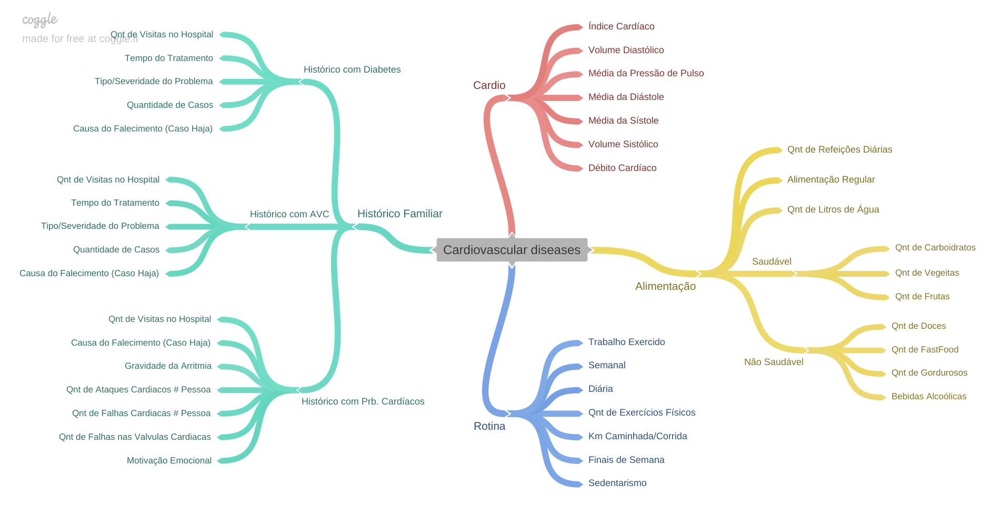

In [146]:
Image('../img/mindmap.png')

## 2.2. Hypothesis List

**1.** Pessoas acima de 45 anos possuem 70% mais chances de desenvolverem doenças cardiovasculares.

**2.** Pessoas com um grau de imc acima de 100 possuem 80% mais chances de desenvolver doenças cardiovasculares.

**3.** A média de Preção de pulso é 50% superior em pessoas com idade acima de 50 anos.

**4.** Pessoas Alcoólicas possuem uma chance maior de desenvolver doenças cardiovasculares em relação a pessoas fumantes.

**5.** Pessoas que sofrem de Nanismo possuem um colesterol 25% superior a uma pessoa adulta normal.

**6.** Pessoas com um alto teor de glicose no sangue possuem uma pressão sistólica e diastólica 60% superior.

## 2.3. Feature Engineering

- Pulse Volume is difference between systolic and diastolic values.

For next cycle i try to make other documented features, but i do not have the data, and is easy to put bias on dataset or wrong columns values because have a range of values.

In [18]:
df2['pulse_pressure'] = df2['systolic'] - df2['diastolic']
df2['bmi'] = (df2['weight'] / (df2['height']**2))
df4['fat_info'] = df4.cholesterol * df4.gluc

## Possible Other Features
# Ídice Cardiaco
# Débito Cardiaco
# Btm # Min
# Volume Sistólico (60-70)
# Volume Sistólico Final (Ventriculo Esquerdo) (28.6 - 61.8)
# Volume Diastolico Final (Ventriculo Esquerdo) (98.4 - 158)
# Volume Sistolico Final (Ventriculo Direito) (35.2 - 72)
# Volume Diastolico Final (Ventriculo Direito) (95.8 - 157.2)

# 3.0. Dataset Filtering 

In [336]:
df3 = df2.copy()

## 3.1. Filtering Rows

- Define a Threshold for Diastolic and Systolic.

In [337]:
# On First Cycle
df3 = df3[(df3.systolic < 200)]#['systolic'].hist()
df3 = df3[~df3.systolic < 10]

df3 = df3[df3.diastolic < 160]
df3 = df3[~df3.diastolic < -5]

df3 = df3[df3.weight > 40]
df3 = df3[(df3.height > .70) & (df3.height < 2.30)]

df3 = df3[df3.bmi < 200]

In [338]:
# Next Cycle (Check if Exists Negative Pulse Pressure) *
df3[df3.pulse_pressure < 0].head(4)

,id,age,gender,height,weight,systolic,diastolic,cholesterol,gluc,smoke,alco,active,cardio,pulse_pressure,bmi
474,681,52,1,1.56,65.0,120,150,2,1,0,0,1,0,-30,26.709402
567,815,58,1,1.68,78.0,14,90,2,1,0,0,1,1,-76,27.636054
636,913,56,2,1.69,68.0,70,110,1,1,0,0,1,0,-40,23.808690
927,1294,59,2,1.75,70.0,14,90,3,1,0,0,1,1,-76,22.857143


## 3.2. Filtering Columns

In [339]:
df3 = df3.drop('id', axis=1)

## 3.3. Dataset Results

In [49]:
simple_metrics(df3 )

,att,min,max,mean,trim_mean,median,std,range,skew,kurtosis
0,age,29.000000,64.000000,52.823247,53.321585,53.000000,6.768622,35.000000,-0.303364,-0.821465
1,gender,1.000000,2.000000,1.348761,1.247938,1.000000,0.476578,1.000000,0.634699,-1.597204
2,height,0.710000,2.070000,1.644038,1.643434,1.650000,0.080156,1.360000,-0.216619,2.743388
3,weight,41.000000,200.000000,74.138342,72.564449,72.000000,14.234304,159.000000,1.020501,2.481201
4,systolic,7.000000,197.000000,126.176011,124.563822,120.000000,17.286475,190.000000,-0.034919,4.900911
5,diastolic,6.000000,150.000000,81.269947,81.419125,80.000000,9.550909,144.000000,0.203415,2.809041
6,cholesterol,1.000000,3.000000,1.363753,1.082403,1.000000,0.678279,2.000000,1.600585,1.038169
7,gluc,1.000000,3.000000,1.225366,1.000000,1.000000,0.571375,2.000000,2.406414,4.336585
8,smoke,0.000000,1.000000,0.087751,0.000000,0.000000,0.282932,1.000000,2.914186,6.492671
9,alco,0.000000,1.000000,0.053387,0.000000,0.000000,0.224804,1.000000,3.973446,13.788677


In [344]:
df3.to_csv('../data_backup/df3.csv')

# <font color="red"> 4.0. Dataset Balance </font>

In [2]:
df4 = pd.read_csv("../data_backup/df3.csv")
df4 = df4.drop('Unnamed: 0', axis=1)

## <font color="red"> 4.1. SMOTEEN </font>

In [7]:
ratio = {0: 34744, 1: 34500};

In [8]:
sn = SMOTEENN(sampling_strategy=ratio, n_jobs=-1)
x_sn, y_sn = sn.fit_resample(df4, df4.cardio)

In [20]:
a = pd.DataFrame(y_sn.value_counts().to_dict(), index=["Smoteen"])
b = pd.DataFrame(df4.cardio.value_counts().to_dict(), index=["Default"])

pd.concat([a, b], axis=0)

,0,1
Smoteen,21705,18819
Default,34744,33962


## <font color="red"> 4.2. SMOTETomek </font> 

In [21]:
st = SMOTETomek(sampling_strategy=ratio, n_jobs=-1)
x_st, y_st = st.fit_resample(df4, df4.cardio)

In [22]:
a = pd.DataFrame(y_st.value_counts().to_dict(), index=["SMTomek"])
b = pd.DataFrame(df4.cardio.value_counts().to_dict(), index=["Default"])

pd.concat([a, b], axis=0)

,0,1
SMTomek,32348,32104
Default,34744,33962


In [28]:
df_sn = pd.concat([x_sn, y_sn], axis=1)
df_st = pd.concat([x_st, y_st], axis=1)

df_sn.to_csv("../data_backup/df_sn.csv")
df_st.to_csv("../data_backup/df_st.csv")

# 5.0. Exploratory Data Analysis

In [50]:
df5 = pd.read_csv('../data_backup/df3.csv')
df5 = df5.drop('Unnamed: 0', axis=1)

msk = (df5.cardio == 1)

## 5.1. Univariable Analysis

### 5.1.1. Response Variable

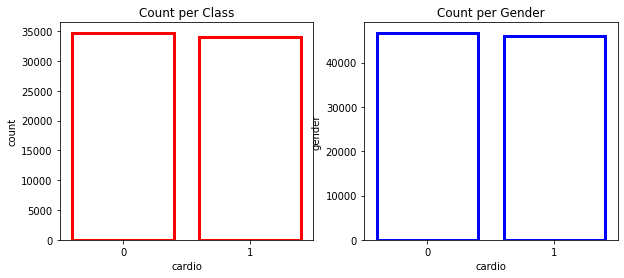

In [39]:
aux = df5[['cardio', 'gender']].groupby('cardio').sum().reset_index()

plot_count_gender(df5, aux)

### 5.1.2. Numerical Variables

<Figure size 1800x1296 with 0 Axes>

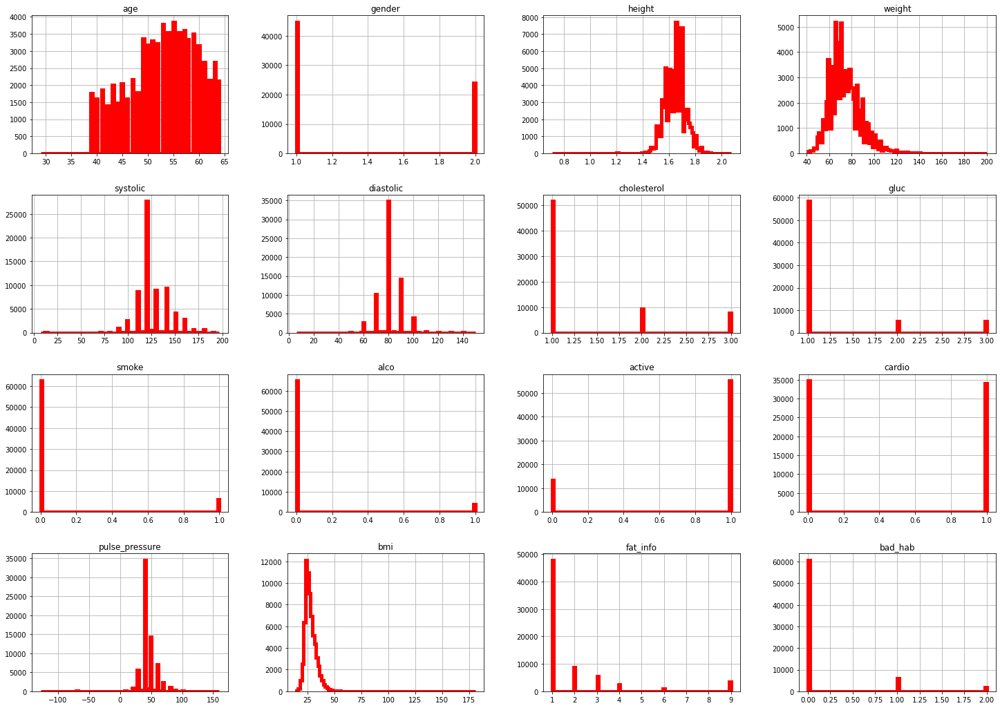

In [19]:
plt.tight_layout(w_pad=2., h_pad=5.)
simple_metrics(df5, num=True).hist(**args(bins=100, lwidth=5));

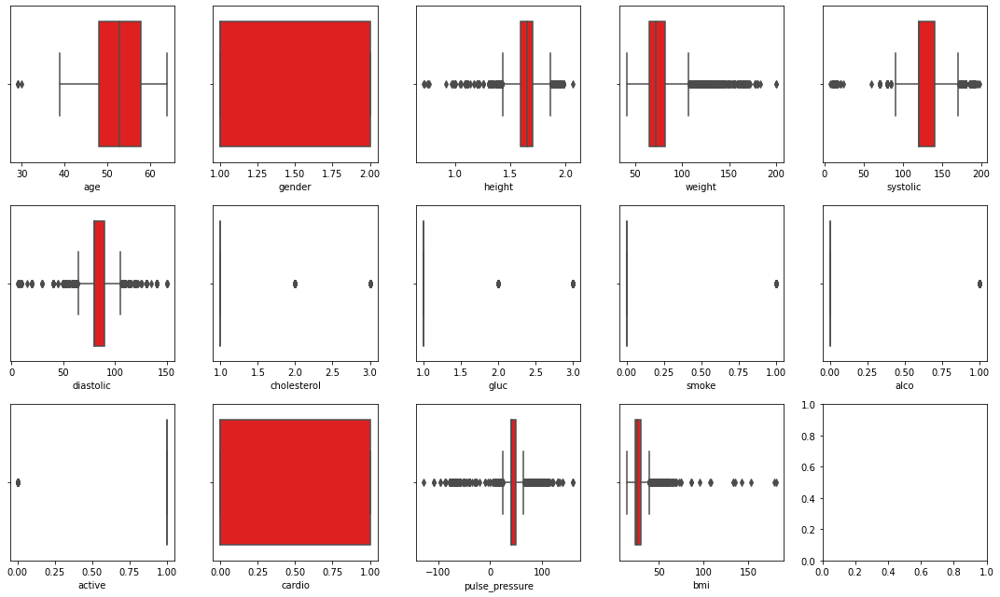

In [61]:
fig, ax = plt.subplots(3, 5, figsize=(15, 9))
for k in zip( ax.flatten(), df4.columns.tolist() ):
    plt.tight_layout()
    sns.boxplot(df4[k[1]], ax=k[0], palette=palette)

#### 4.1.2.1 Normal Test

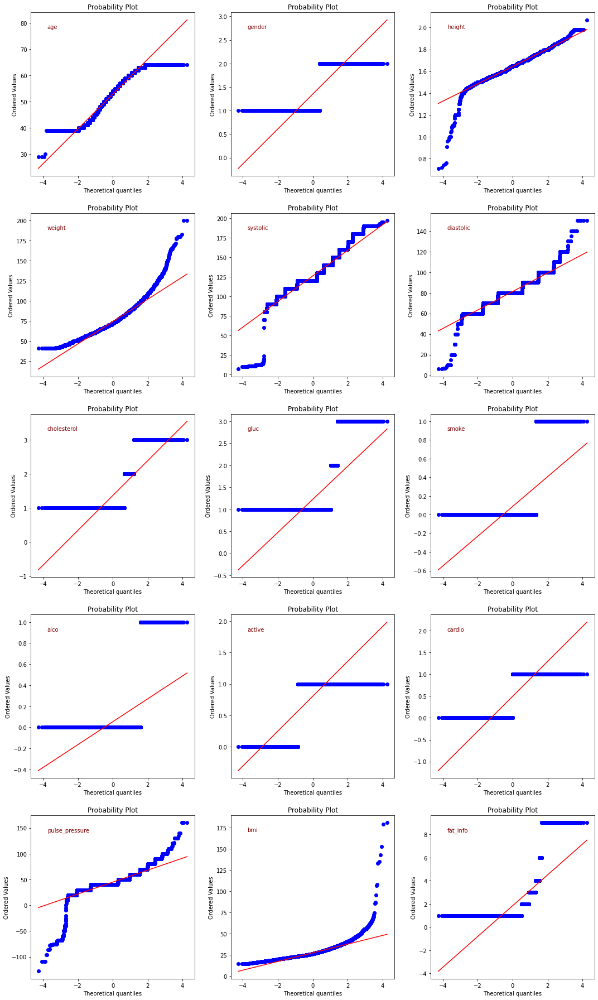

In [13]:
qq_plot(df4, (5, 3))

age -> NormaltestResult(statistic=7477.75666256402, pvalue=0.0)
gender -> NormaltestResult(statistic=342476.70187113073, pvalue=0.0)
height -> NormaltestResult(statistic=4960.3076509828215, pvalue=0.0)
weight -> NormaltestResult(statistic=12384.432842398955, pvalue=0.0)
systolic -> NormaltestResult(statistic=7422.634566348087, pvalue=0.0)
diastolic -> NormaltestResult(statistic=5004.429528414961, pvalue=0.0)
cholesterol -> NormaltestResult(statistic=16921.446405037834, pvalue=0.0)
gluc -> NormaltestResult(statistic=31504.90123886583, pvalue=0.0)
smoke -> NormaltestResult(statistic=39182.090323937526, pvalue=0.0)
alco -> NormaltestResult(statistic=54025.20026291651, pvalue=0.0)
active -> NormaltestResult(statistic=14849.180181173704, pvalue=0.0)
cardio -> NormaltestResult(statistic=234356.22126269533, pvalue=0.0)
pulse_pressure -> NormaltestResult(statistic=25202.113988552934, pvalue=0.0)
bmi -> NormaltestResult(statistic=47876.60579160741, pvalue=0.0)


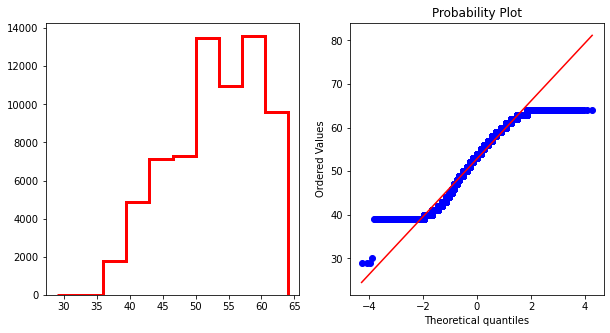

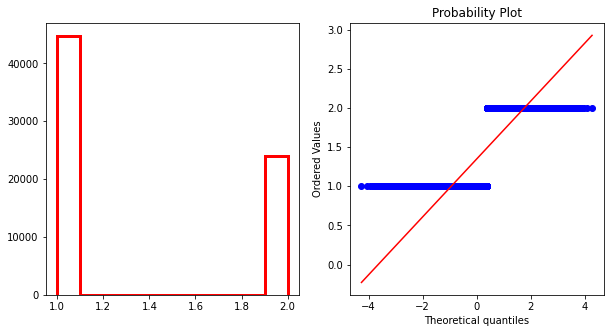

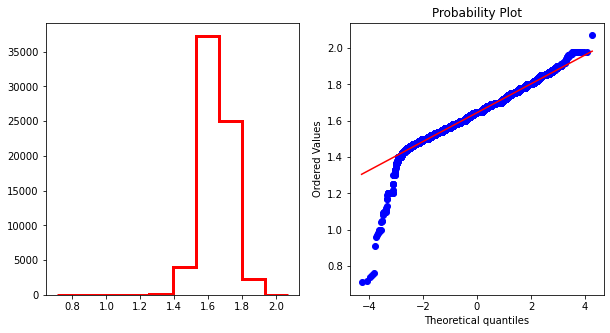

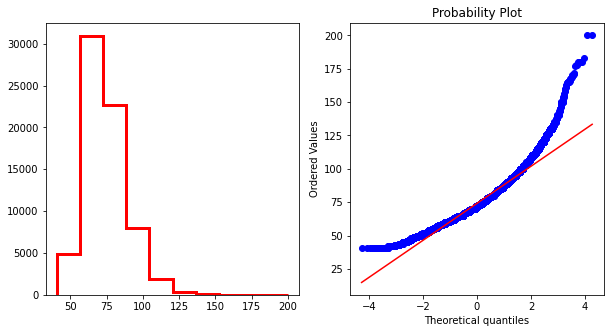

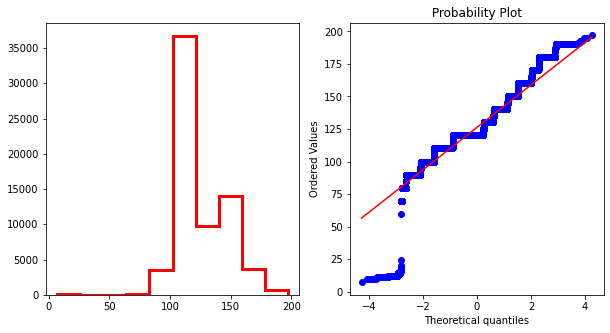

...

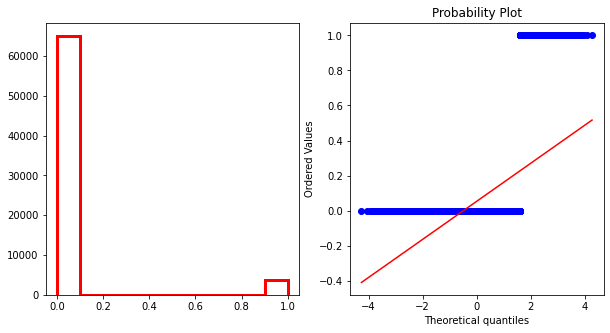

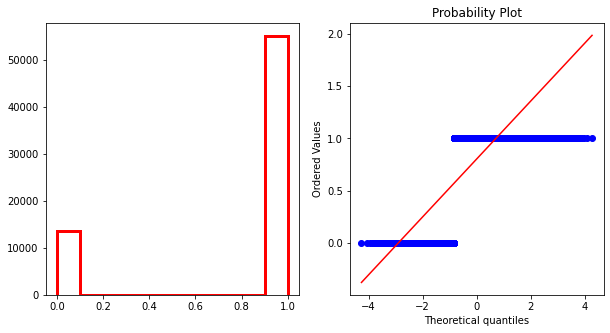

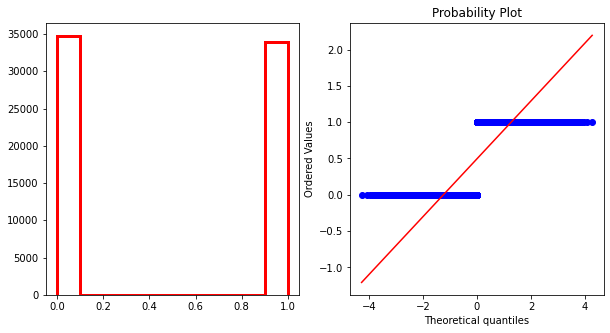

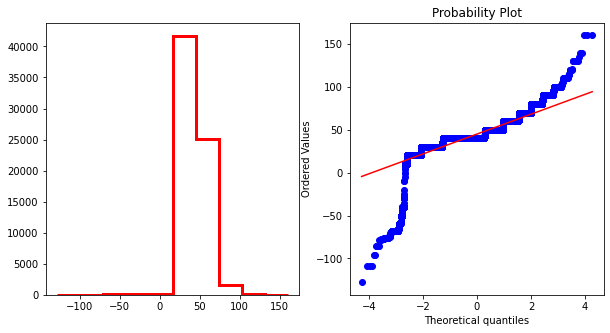

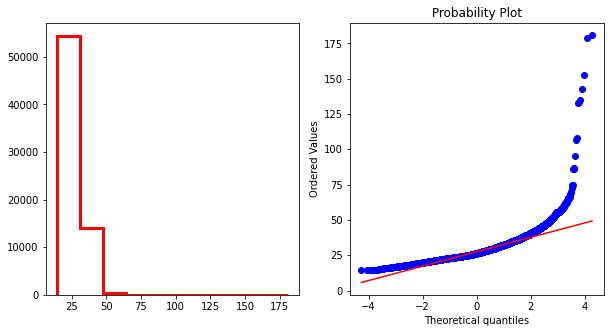

In [203]:
#data = [np.random.lognormal(100) for _ in range(1000)]

for k in df4.columns.tolist():
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].hist(df4[k], **args(bins=10));
    ss.probplot(df4[k], plot=ax[1]);

    print(f"{k} -> {ss.normaltest(df4[k])}")

### 5.1.3. Numerical Per Target Class

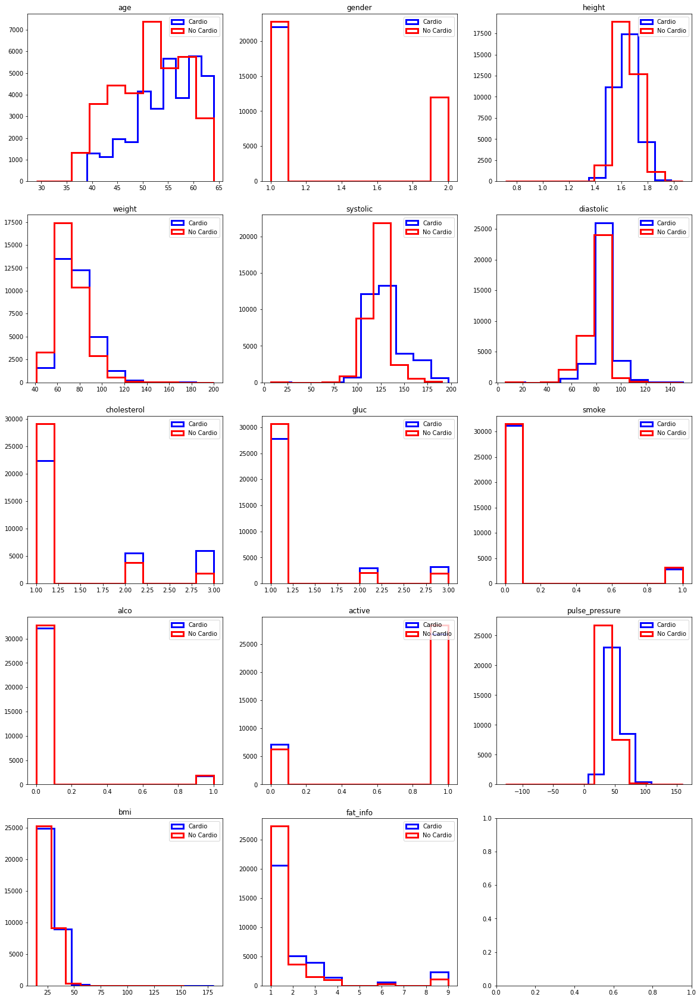

In [37]:
aux = df5.drop('cardio', axis=1)

plot_hist(aux, (5, 3))

## 5.2. Bivariable Analysis

### **1.** Pessoas acima de 45 anos possuem 70% mais chances de desenvolverem doenças cardiovasculares.

**Verdadeiro** Pessoas acima de 45 Anos possuem mais de 70% de desenvolver alguma doença cardiovascular.

In [349]:
aux1 = df5[['age', 'cardio']].groupby('age').count().reset_index()
aux2 = df5[msk][['age', 'cardio']].groupby('age').count().reset_index()
aux3 = df5[~msk][['age', 'cardio']].groupby('age').count().reset_index()

Teste T para validar a diferença das médias (Apx Teste Perm).

In [311]:
ts, p = ss.ttest_ind(aux2.loc[aux2['age'] >= 45, 'cardio'], aux2.loc[aux2['age'] < 45, 'cardio'])
print("T-Test P Valor: {:.5f}".format(p))

T-Test P Valor: 0.00001


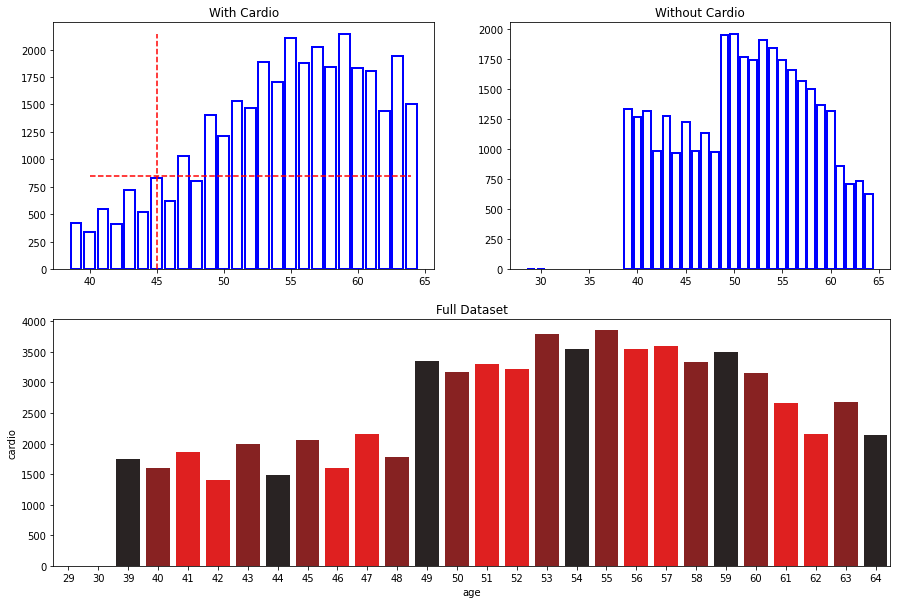

In [350]:
plot_cardio(aux1, aux2, aux3, 'age')

### **2.** Pessoas do sexo "2" com um grau de imc acima de 75 possuem 80% mais chances de desenvolver doenças cardiovasculares.

**Falso** Dependendo de como é a interação com as outras variáveis de uma pessoa desse tipo, de acordo com o Dataset não possui mais chances de desenvolver doenças cardiovasculares.

In [532]:
aux = df5[df5['bmi'] >= 75.]
aux1 = aux[['gender', 'cardio']].groupby('gender').count().reset_index()
aux2 = aux[msk][['gender', 'cardio']].groupby('gender').count().reset_index()
aux3 = aux[~msk][['gender', 'cardio']].groupby('gender').count().reset_index()

Teste de Kruskal para distribuição não normais e com variância diferente.


 Kruskal -> 537.8691492879308 / 0.00000

 Kruskal -> 385.6360577243551 / 0.00000

 Kruskal -> 212.06344048413817 / 0.00000


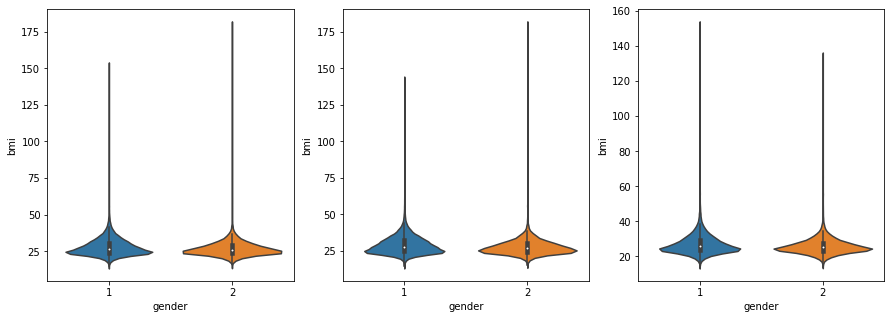

In [533]:
s1, p1 = ss.kruskal(df5.loc[df5['gender'] == 1, 'bmi'], df5.loc[df5['gender'] == 2, 'bmi'])
s2, p2 = ss.kruskal(df5[msk].loc[df5['gender'] == 1, 'bmi'], df5[msk].loc[df5['gender'] == 2, 'bmi'])
s3, p3 = ss.kruskal(df5[~msk].loc[df5['gender'] == 1, 'bmi'], df5[~msk].loc[df5['gender'] == 2, 'bmi'])

print("\n Kruskal -> {} / {:.5f}".format(s1, p1))
print("\n Kruskal -> {} / {:.5f}".format(s2, p2))
print("\n Kruskal -> {} / {:.5f}".format(s3, p3))

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
sns.violinplot(df5['gender'], df5['bmi'], ax=ax[0]);
sns.violinplot(df5[msk]['gender'], df5[msk]['bmi'], ax=ax[1])
sns.violinplot(df5[~msk]['gender'], df5[~msk]['bmi'], ax=ax[2]);

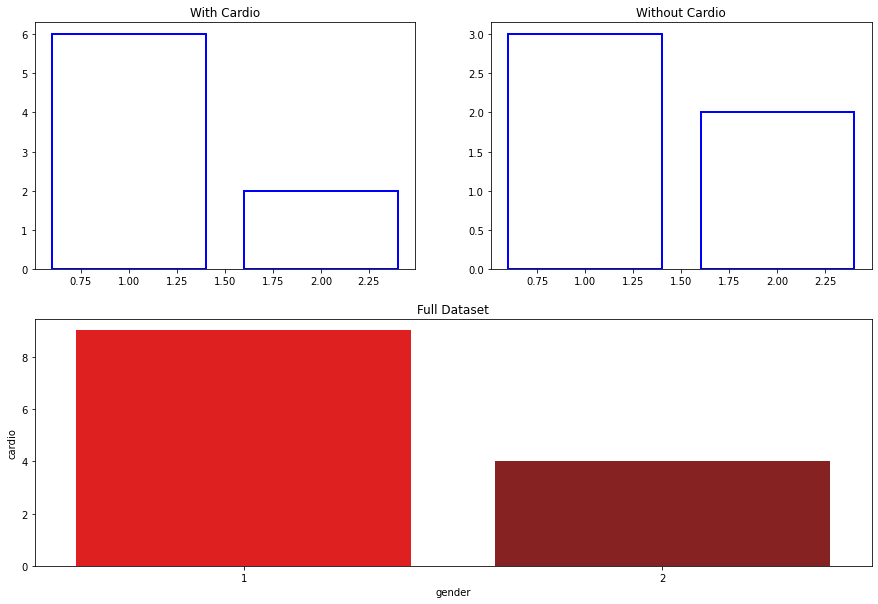

In [356]:
plot_cardio(aux1, aux2, aux3, 'gender')

In [364]:
fig = px.scatter(df5, x='gender', y='bmi', color='cardio')
fig.show()

In [368]:
fig = px.scatter_3d(df5, x='gender', y='age', z='bmi', color='cardio')
fig.show()

### **3.** A média de Preção de pulso é 50% superior em pessoas com idade acima de 50 anos.

**Falso** A pressão de pulso não é maior que 50% em relação as demais pressões para pessoas com idade maior que 50 anos.

In [ ]:
aux1 = df5[['pulse_pressure', 'age']].groupby('age').mean().reset_index()
aux2 = df5[msk][['pulse_pressure', 'age']].groupby('age').mean().reset_index()
aux3 = df5[~msk][['pulse_pressure', 'age']].groupby('age').mean().reset_index()

In [450]:
ks, ps = ss.kruskal(aux2.pulse_pressure, aux3.pulse_pressure)
print(f'KStats: {ks}, P-Valor: {ps}')

KStats: 39.71060455896929, P-Valor: 2.9452195815744224e-10


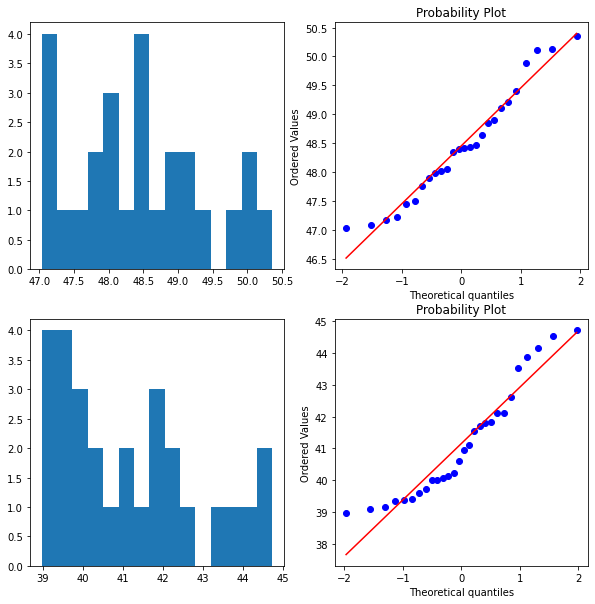

In [460]:
fig, ax = plt.subplots(2, 2, figsize=(10, 10))
ax = ax.flatten()
ax[0].hist(aux2.pulse_pressure, bins=15)
ss.probplot(aux2.pulse_pressure, plot=ax[1])

ax[2].hist(aux3.pulse_pressure, bins=15)
ss.probplot(aux3.pulse_pressure, plot=ax[3]);

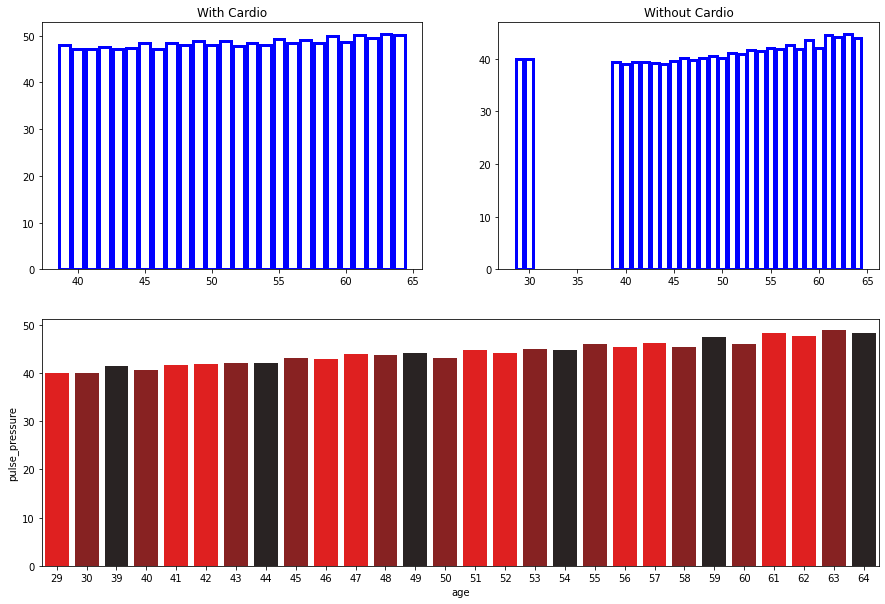

In [442]:
plot_pulse_pression(aux1, aux2, aux3)

### **4.** Pessoas Alcoólicas possuem uma chance maior de desenvolver doenças cardiovasculares em relação a pessoas fumantes.

**Falso** Na verdade, pessoas fumantes tem maior índice de doenças cardiovasculates.

In [798]:
aux1 = df5[(df5['smoke'] == 1) & (df5['alco'] == 0)][['age', 'cardio']].groupby('age').sum().reset_index()
aux2 = df5[(df5['smoke'] == 0) & (df5['alco'] == 1)][['age', 'cardio']].groupby('age').sum().reset_index()

In [799]:
ks, ps = ss.kruskal(aux1['cardio'], aux2['cardio'])
print(f'Ks: {ks}, P-Valor: {ps}')

Ks: 20.9610863596758, P-Valor: 4.687075614795284e-06


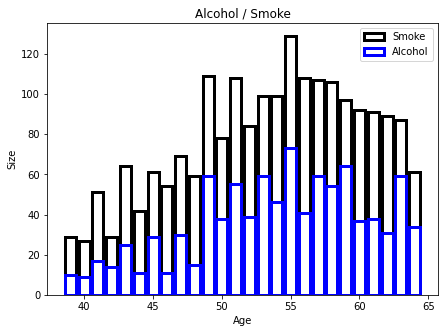

In [800]:
fig, ax = plt.subplots(figsize=(7, 5))
ax.bar(aux1['age'], aux1['cardio'], label='Smoke', **args_b(edgecolor="k"))
ax.bar(aux2['age'], aux2['cardio'], label='Alcohol', **args_b(edgecolor="b"))
ax.set_title('Alcohol / Smoke')
ax.set_xlabel('Age')
ax.set_ylabel('Size')
plt.legend();

### **5.** Pessoas que sofrem de Nanismo possuem um colesterol 25% superior a uma pessoa adulta normal.

**Falso** Pessoas com Nanismo não possuem um nível de colesterol maior.

In [593]:
aux1 = df5[df5['height'] < 1.1]
aux2 = df5[df5['height'] >= 1.1]
aux3 = aux1[['cholesterol', 'cardio', 'gender']].groupby(['cholesterol', 'gender']).sum().reset_index()
aux4 = aux2[['cholesterol', 'cardio', 'gender']].groupby(['cholesterol', 'gender']).sum().reset_index()

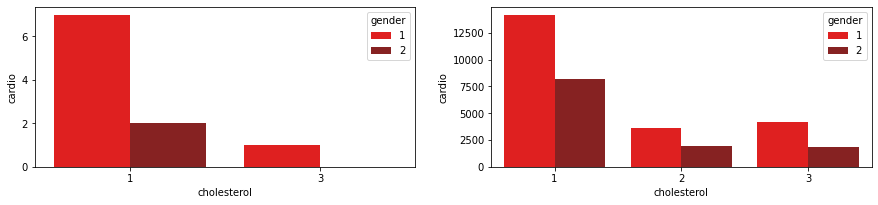

In [657]:
aux5 = aux1[msk][['systolic', 'diastolic', 'cholesterol']]
aux6 = aux1[~msk][['systolic', 'diastolic', 'cholesterol']]

ax1 = plt.subplot2grid((3, 2), (0, 0))
ax2 = plt.subplot2grid((3, 2), (0, 1))

sns.barplot(aux3['cholesterol'], aux3['cardio'], hue=aux3['gender'], ax=ax1, palette=palette)
sns.barplot(aux4['cholesterol'], aux4['cardio'], hue=aux4['gender'], ax=ax2, palette=palette);

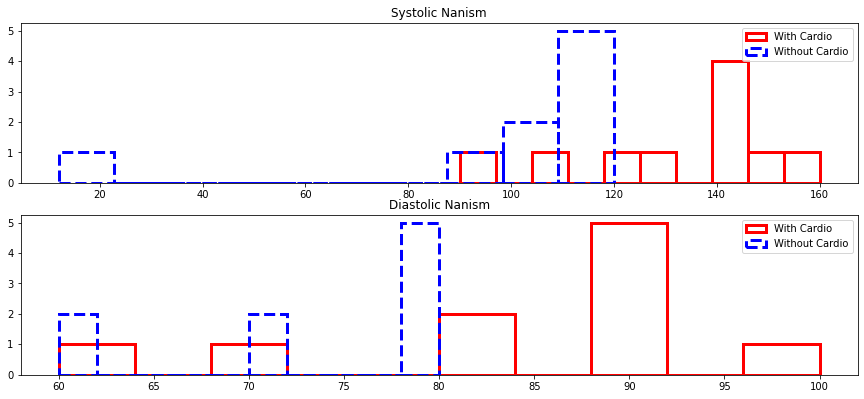

In [661]:
ax3 = plt.subplot2grid((3, 2), (1, 0), colspan=2)
ax4 = plt.subplot2grid((3, 2), (2, 0), colspan=2)

ax3.hist(aux5['systolic'], label='With Cardio', **args_b());
ax3.hist(aux6['systolic'], label='Without Cardio', linestyle='dashed', **args_b(edgecolor='b'));
ax3.set_title("Systolic Nanism")
ax3.legend()

ax4.hist(aux5['diastolic'], label='With Cardio', **args_b());
ax4.hist(aux6['diastolic'], label='Without Cardio', linestyle='dashed', **args_b(edgecolor='b'));
ax4.set_title("Diastolic Nanism")
ax4.legend();

### **6.** Pessoas com um alto teor de glicose no sangue possuem uma pressão sistólica e diastólica 60% superior.

**Falso** Idependentemente da Glicose no organismo, os níveis da pressão sistolica e diastolica não mudam.

In [748]:
aux1 = df5[['gluc', 'cardio']].groupby('gluc').sum().reset_index()
aux2 = df5[msk] [['gluc', 'diastolic']].groupby('gluc').sum().reset_index()
aux3 = df5[~msk][['gluc', 'diastolic']].groupby('gluc').sum().reset_index()
aux4 = df5[msk] [['gluc', 'systolic']].groupby('gluc').sum().reset_index()
aux5 = df5[~msk][['gluc', 'systolic']].groupby('gluc').sum().reset_index()

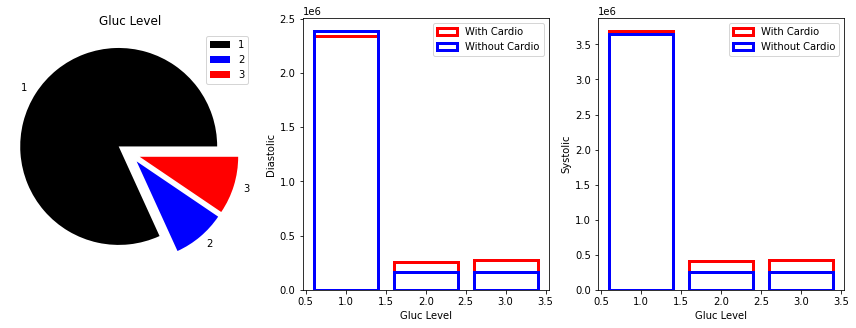

In [790]:
plot_gluc(aux1, aux2, aux3, aux4, aux5)

## 5.3. Multivariable Analysis 

### 5.3.1. Numerical Variables

- No Cardio

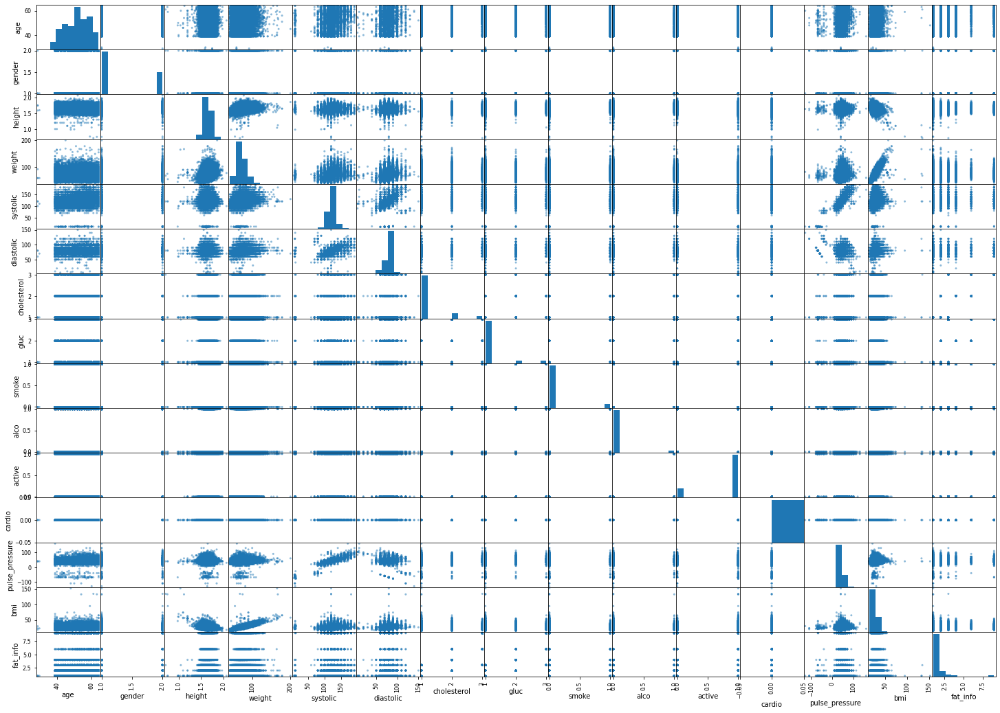

In [54]:
scatter_matrix(df5[~msk]);

- With Cardio 

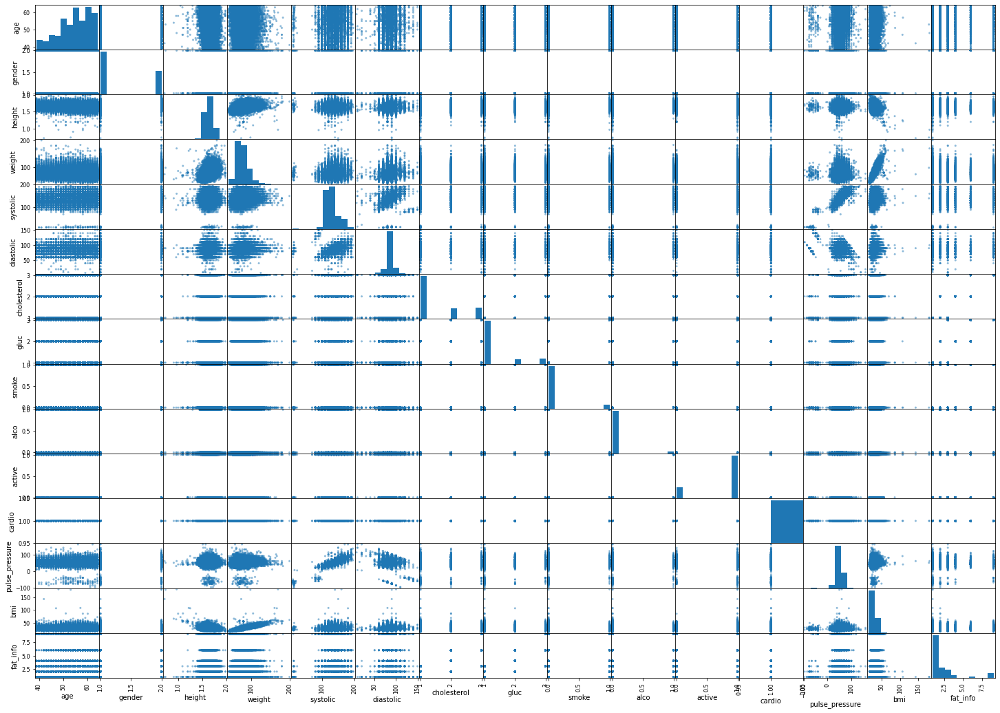

In [52]:
scatter_matrix(df5[msk]);

<AxesSubplot:>

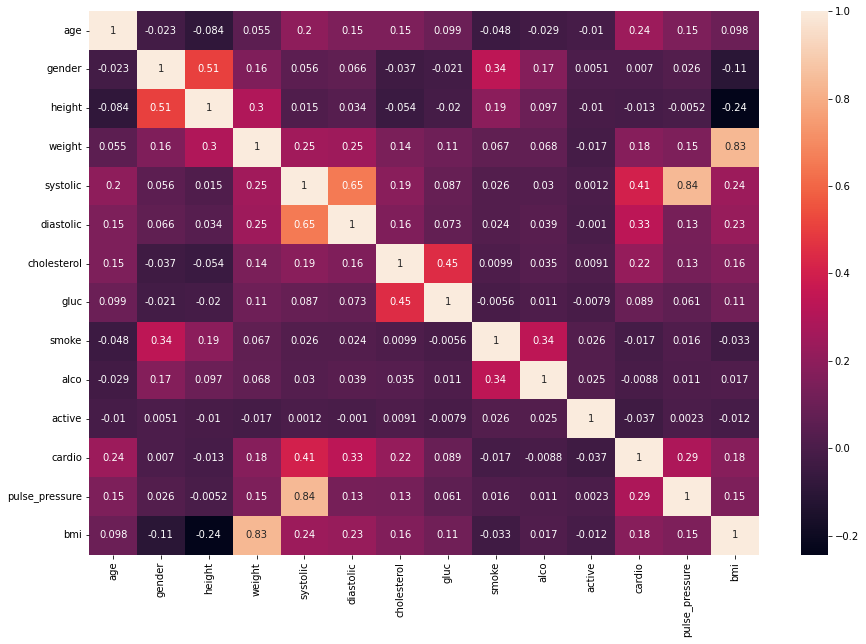

In [796]:
sns.heatmap(df5.corr(method='pearson'), annot=True)

## 5.4. EDA Results

1. Univariable
    - Do Not Have Good Classification Region the Features (Need Feature Engineering).
    
2. Bivariable
    - H. Validation.
        - Nanism Good Future Feature.
        
        
3. Multivariable
    - Correlated Gender and Height.
   

# <font color="red"> 6.0. Data Preparation </font>

In [103]:
df6 = pd.read_csv('../data_backup/df3.csv')
df6 = df6.drop('Unnamed: 0', axis=1)
msk = (df6.cardio == 1)

# Drop Correlated Features
df6 = df6.drop(['weight'], axis=1)
df6['gender'] = df6['gender'].apply( lambda x: 1 if x == 2 else 0 )

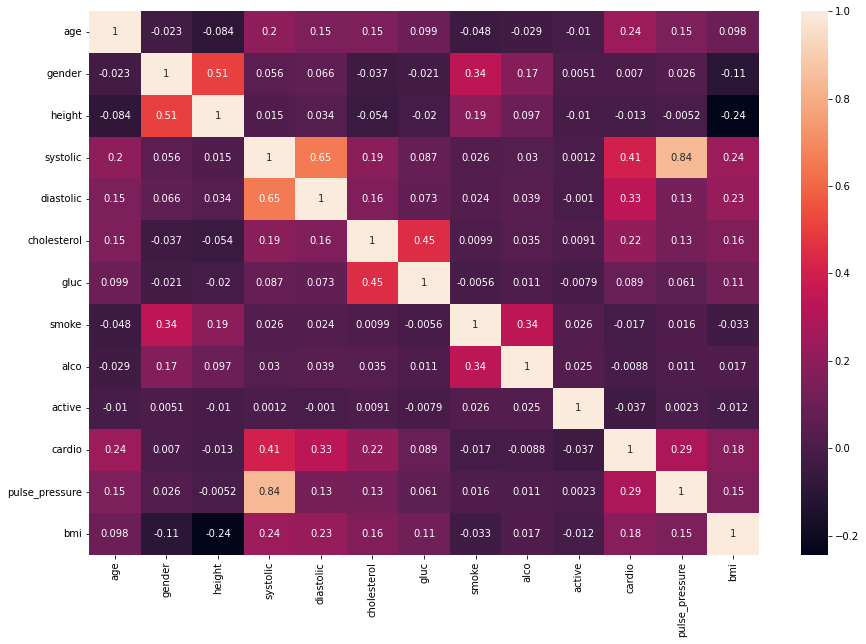

In [104]:
sns.heatmap(df5.corr(), annot=True);

## 5.1. Rescaling

In [18]:
rs = RobustScaler()
mms = MinMaxScaler()

In [107]:
gluc_frequency = df6.gluc.value_counts() / len(df6)
cholesterol_frequency = df6.cholesterol.value_counts() / len(df6)
df6.gluc = df6.gluc.apply( lambda x: gluc_frequency[x] )
df6.cholesterol = df6.cholesterol.apply( lambda x: cholesterol_frequency[x] )

df6['age'] = mms.fit_transform(df6[['age']].values)
df6['height'] = mms.fit_transform(df6[['height']].values)
df6['systolic'] = mms.fit_transform(df6[['systolic']].values)
df6['diastolic'] = mms.fit_transform(df6[['diastolic']].values)

df6['bmi'] = rs.fit_transform(df6[['bmi']].values)
df6['pulse_pressure'] = rs.fit_transform(df6[['pulse_pressure']].values)

In [119]:
df6 = df6[['age', 'gender', 'height', 'systolic', 'diastolic', 'cholesterol', 'gluc', 'smoke', 'alco', 'active', 'pulse_pressure', 'bmi', 'cardio']]

## <font color="red"> 5.2. Rescaling SMOTEEN Dataset </font>

In [15]:
df_sn = pd.read_csv("../data_backup/df_sn.csv")
df_sn = df_sn.drop(columns=["Unnamed: 0", "weight", 'cardio'], axis=1)

In [19]:
df_sn = prepare_dataset(df_sn, mms, rs)

In [21]:
df_sn.to_csv("../data_backup/df_sn_prep.csv")

## <font color="red"> 5.3. Rescaling SMOTETOMEK Dataset </font>

In [22]:
df_st = pd.read_csv("../data_backup/df_st.csv")
df_st = df_st.drop(columns=["Unnamed: 0", "weight", "cardio"], axis=1)

In [23]:
df_st = prepare_dataset(df_st, mms, rs)

In [24]:
df_st.to_csv("../data_backup/df_st_prep.csv")

# <font color="red"> 7.0. Feature Selection </font>

In [121]:
df7 = df6.copy()

X = df7.iloc[:, :-1]
y = df7.iloc[:, -1]

## 7.1. First Cycle 

### 7.1.1. Tree-Based Feature Selection

In [125]:
rf = RandomForestClassifier(n_jobs=-1).fit(X.values, y.values)
xg = XGBClassifier(n_jobs=-1).fit(X.values, y.values)

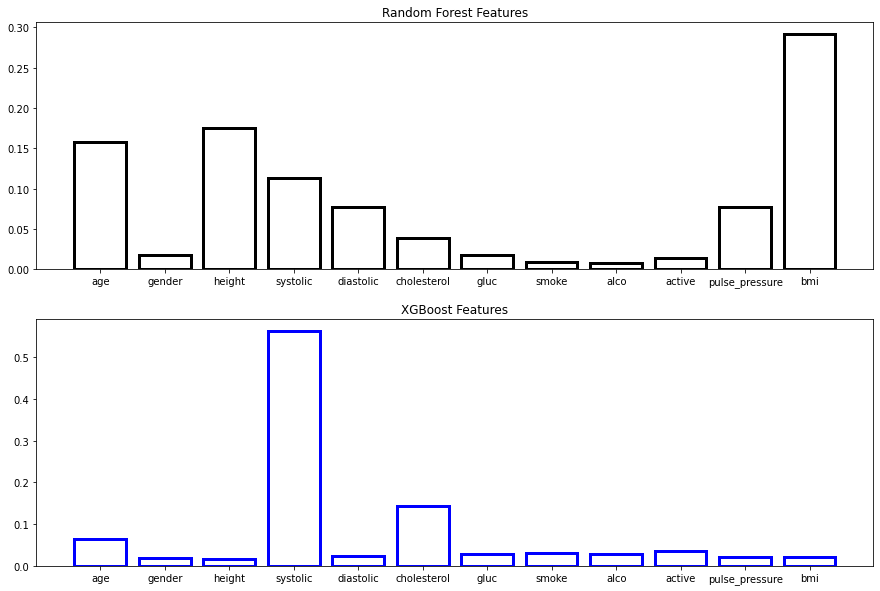

In [154]:
plot_importances(rf, xg, X.columns.tolist())

### 7.1.2. Boruta Feature Selection

- Next Cycle

### 7.1.3. Manual Feature Selection

In [181]:
df6.to_csv('../data_backup/df6.csv')

First Cycle

In [26]:
# Drop smoke, alco
cols = ['age', 'height', 'systolic', 'diastolic', 'cholesterol', 'gluc', 
        'pulse_pressure', 'bmi', 'cardio']

## <font color="red"> 7.2. Second Cycle </font>

In [3]:
df_sn = pd.read_csv("../data_backup/df_sn_prep.csv")
df_st = pd.read_csv("../data_backup/df_st_prep.csv")
df_sn = df_sn.drop('Unnamed: 0', axis=1)
df_st = df_st.drop('Unnamed: 0', axis=1)

In [5]:
X_sn = df_sn.iloc[:, :-1]
y_sn = df_sn.iloc[:, -1]

X_st = df_st.iloc[:, :-1]
y_st = df_st.iloc[:, -1]

### <font color="red"> 7.2.1. Tree-Based Feature Selection </font>

In [9]:
rf = RandomForestClassifier(n_jobs=-1).fit(X_sn, y_sn)
xg = XGBClassifier(n_jobs=-1).fit(X_sn, y_sn)

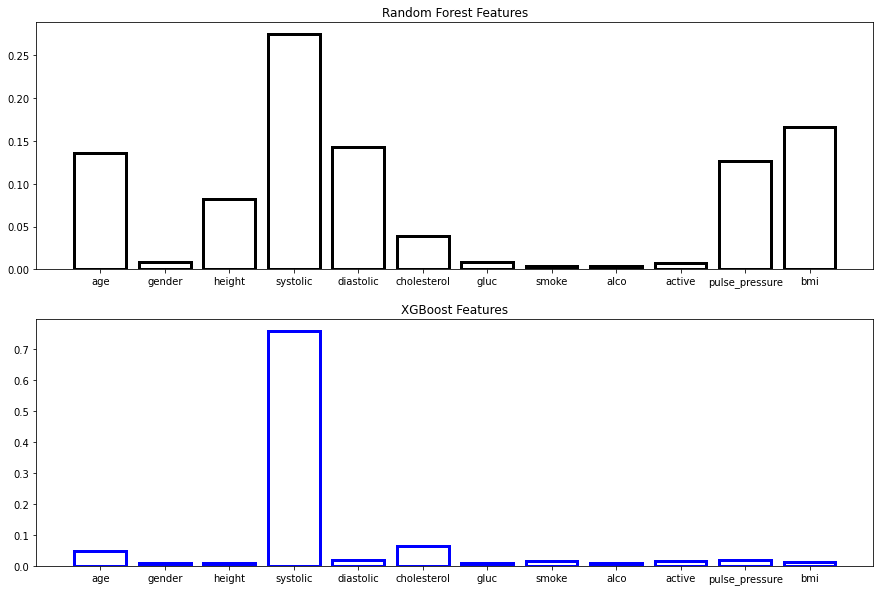

In [8]:
plot_importances(rf, xg, X_sn.columns.tolist())

In [12]:
rf = RandomForestClassifier(n_jobs=-1).fit(X_st, y_st)
xg = XGBClassifier(n_jobs=-1).fit(X_st, y_st)

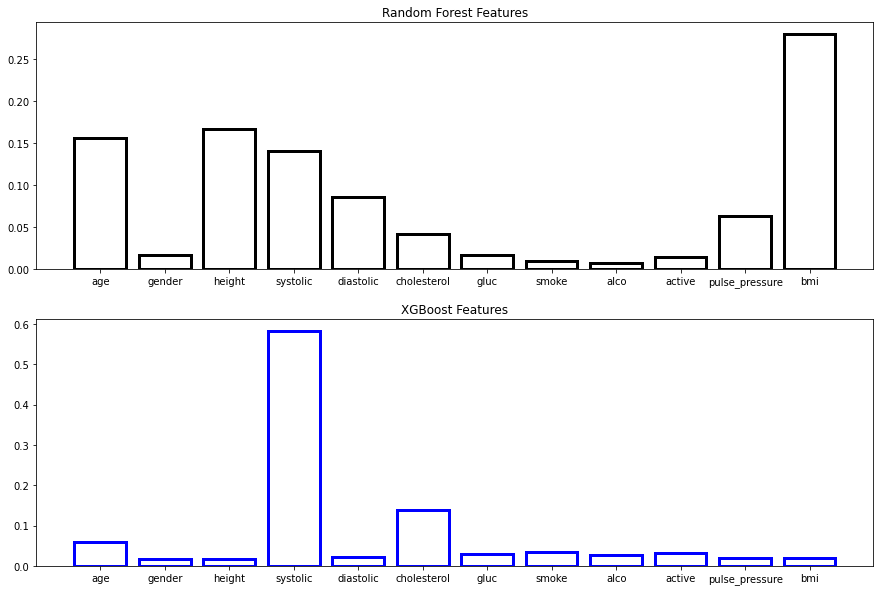

In [11]:
plot_importances(rf, xg, X_st.columns.tolist())

### <font color="red"> 7.2.3. Manual Feature Selection </font>

In [13]:
cols = ['age', 'gender', 'height', 'systolic', 'diastolic', 'cholesterol', 'gluc', 
        'pulse_pressure', 'bmi', 'cardio']

# 8.0. Machine Learning Models

## 8.1. First Cycle Models

In [65]:
df8 = pd.read_csv('../data_backup/df6.csv')[cols]

In [7]:
X = df8.iloc[:, :-1]
Y = df8.iloc[:, -1]

x, x_test, y, y_test = train_test_split(X, Y, test_size=.10)
x_train, x_valid, y_train, y_valid = train_test_split(x, y, test_size=.10)

In [8]:
y_train = np.array(y_train)
y_valid = np.array(y_valid)
y_test  = np.array(y_test)

### 8.1. Baseline Model

In [10]:
k = y_test.shape[0]

yhat_random = choices(population=[0, 1], k=k)

,Model Name,Accuracy,Precision,Kappa Score,ROCAUC,F1-Score
0,Random,0.497308,0.489831,-0.005356,0.497321,0.493994


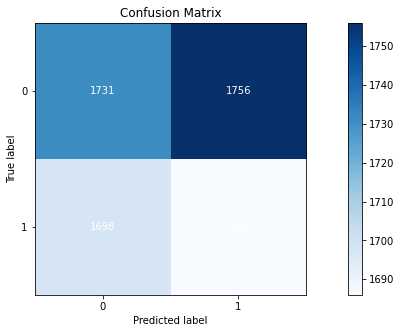

In [18]:
ml_error('Random', y_test, yhat_random)

### 8.2. Support Vector Machines

In [25]:
svc = SVC(max_iter=700, probability=True).fit(x_train, y_train)

In [26]:
yhat_svc = svc.predict(x_valid)
yhat_svr_p = svc.predict_proba(x_valid)

,Model Name,Accuracy,Precision,Kappa Score,ROCAUC,F1-Score
0,SVC,0.39489,0.416,-0.207697,0.395929,0.470721


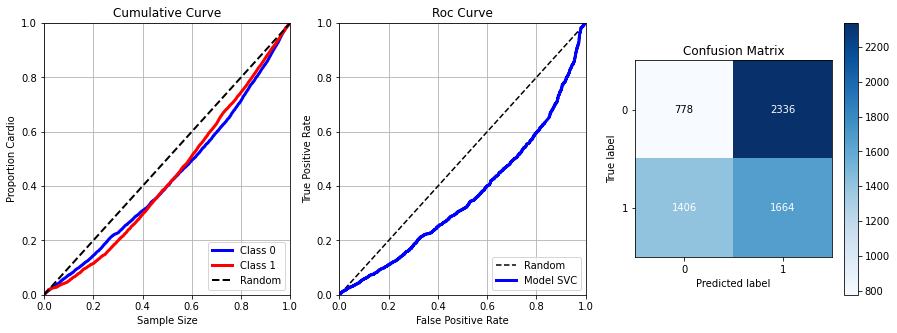

In [27]:
svr_res = ml_error("SVC", y_valid, yhat_svc, yhat_svr_p, True)
svr_res

### 8.3. XGBoost

In [16]:
xgb = XGBClassifier(n_jobs=-1).fit(x_train, y_train)

[17:08:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [17]:
yhat_xgb = xgb.predict(x_valid)
yhat_xgb_p = xgb.predict_proba(x_valid)

,Model Name,Accuracy,Precision,Kappa Score,ROCAUC,F1-Score
0,XGBoost,0.72914,0.741099,0.458031,0.728922,0.719101


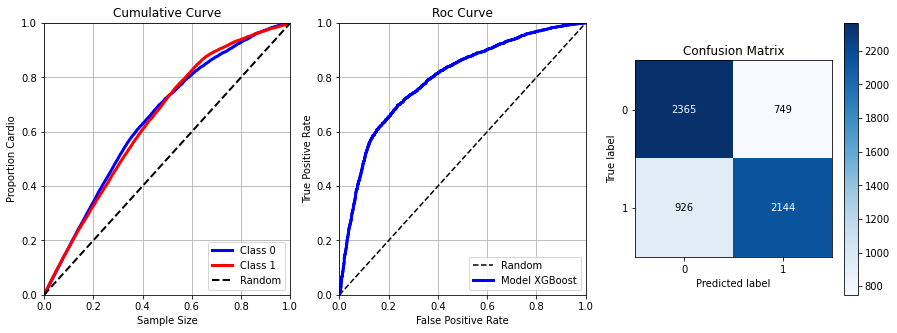

In [18]:
xgb_res = ml_error('XGBoost', y_valid, yhat_xgb, yhat_xgb_p, True)
xgb_res

### 8.4. Random Forest

In [13]:
rf = RandomForestClassifier(n_jobs=-1).fit(x_train, y_train)

In [14]:
yhat_rf = rf.predict(x_valid)
yhat_rf_p = rf.predict_proba(x_valid)

,Model Name,Accuracy,Precision,Kappa Score,ROCAUC,F1-Score
0,Random Forest,0.702943,0.698807,0.405898,0.702964,0.702317


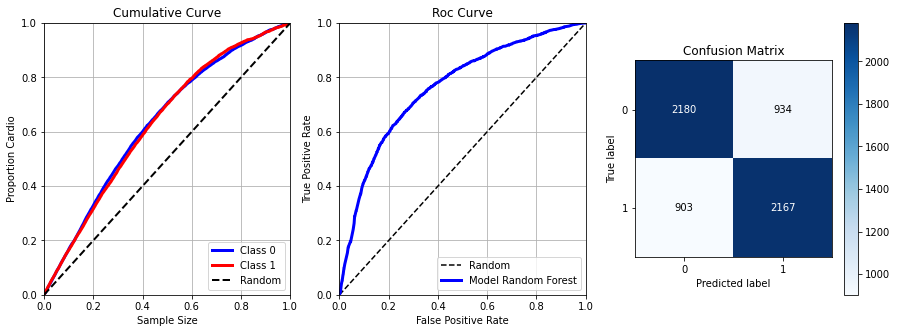

In [15]:
rf_res = ml_error('Random Forest', y_valid, yhat_rf, yhat_rf_p, True)
rf_res

### 8.5. K Neighbors 

In [10]:
kn = KNeighborsClassifier(n_neighbors=10, n_jobs=-1).fit(x_train, y_train)

In [11]:
yhat_kn = kn.predict(x_valid)
yhat_kn_p = kn.predict_proba(x_valid)

,Model Name,Accuracy,Precision,Kappa Score,ROCAUC,F1-Score
0,Nearest Neighbors,0.691462,0.710966,0.382443,0.691083,0.67239


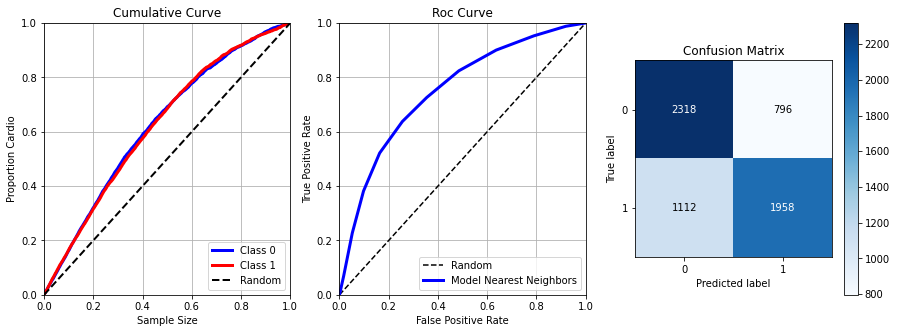

In [12]:
kn_res = ml_error('Nearest Neighbors', y_valid, yhat_kn, yhat_kn_p, True)
kn_res

### 8.6. SGD

In [7]:
sgd = SGDClassifier(loss='log', n_jobs=-1, random_state=33).fit(x_train, y_train)

In [8]:
yhat_sgd = sgd.predict(x_valid)
yhat_sgd_p = sgd.predict_proba(x_valid)

,Model Name,Accuracy,Precision,Kappa Score,ROCAUC,F1-Score
0,SGD,0.717982,0.711551,0.436018,0.718041,0.718891


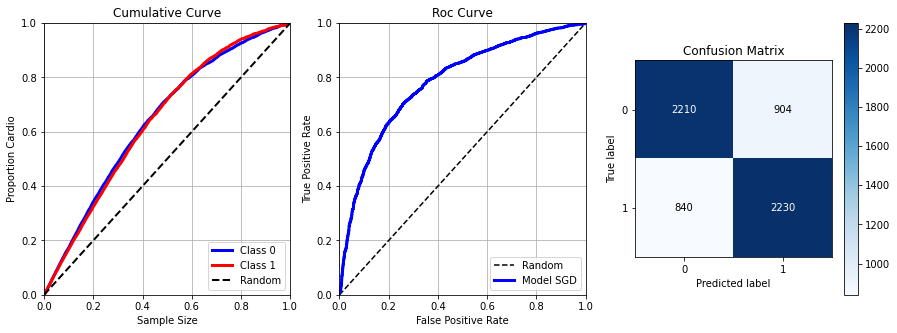

In [9]:
sgd_res = ml_error('SGD', y_valid, yhat_sgd, yhat_sgd_p, True)
sgd_res

### 8.7. LGBM

In [101]:
lgb = LGBMClassifier(n_jobs=-1).fit(x_train, y_train)

In [102]:
yhat_lgb = lgb.predict(x_valid)
yhat_lgb_p = lgb.predict_proba(x_valid)

,Model Name,Accuracy,Precision,Kappa Score,ROCAUC,F1-Score
0,LGBM,0.732212,0.746685,0.464146,0.731964,0.721024


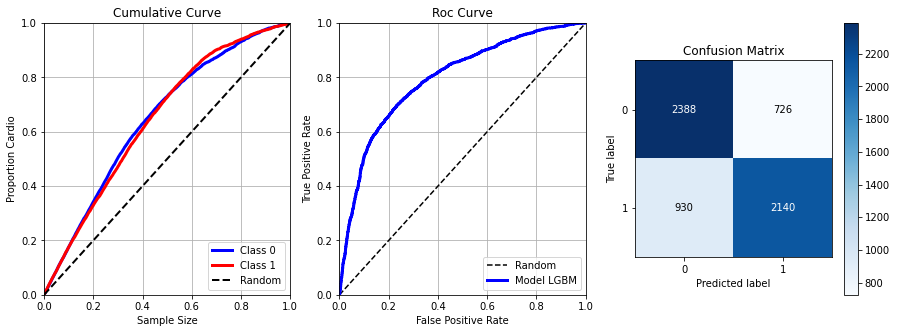

In [103]:
lgb_res = ml_error('LGBM', y_valid, yhat_lgb, yhat_lgb_p, True)
lgb_res

### 8.8. Ada Boost

In [91]:
ada = AdaBoostClassifier().fit(x_train, y_train)

In [92]:
yhat_ada = ada.predict(x_valid)
yhat_ada_p = ada.predict_proba(x_valid)

,Model Name,Accuracy,Precision,Kappa Score,ROCAUC,F1-Score
0,ADA,0.729948,0.760611,0.459391,0.729493,0.709868


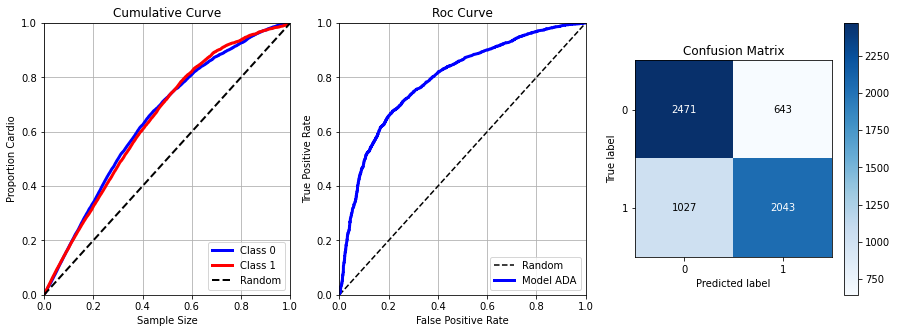

In [94]:
ada_res = ml_error('ADA', y_valid, yhat_ada, yhat_ada_p, True)
ada_res

### 8.9. Models Resume

In [121]:
m = pd.concat([svr_res, xgb_res, rf_res, kn_res, sgd_res, lgb_res, ada_res]).sort_values('Precision', ascending=False).reset_index(drop=True)
m.style.highlight_max(color='#9cf5ff', subset=pd.IndexSlice[:, m.columns.tolist()[1:]])

,Model Name,Accuracy,Precision,Kappa Score,ROCAUC,F1-Score
0,ADA,0.729948,0.760611,0.459391,0.729493,0.709868
1,LGBM,0.732212,0.746685,0.464146,0.731964,0.721024
2,XGBoost,0.729140,0.741099,0.458031,0.728922,0.719101
3,SGD,0.717982,0.711551,0.436018,0.718041,0.718891
4,Nearest Neighbors,0.691462,0.710966,0.382443,0.691083,0.672390
5,Random Forest,0.702943,0.698807,0.405898,0.702964,0.702317
6,SVC,0.394890,0.416000,-0.207697,0.395929,0.470721


## <font color="red"> 8.2. Second Cycle </font>

In [3]:
cols = ['age', 'gender', 'height', 'systolic', 'diastolic', 'cholesterol', 'gluc', 'pulse_pressure', 'bmi', 'cardio']

In [4]:
df_sn = pd.read_csv("../data_backup/df_sn_prep.csv")[cols]
df_st = pd.read_csv("../data_backup/df_st_prep.csv")[cols]

In [5]:
X_sn = df_sn.iloc[:, :-1]
Y_sn = np.array(df_sn.iloc[:, -1])

X_st = df_st.iloc[:, :-1]
Y_st = np.array(df_st.iloc[:, -1])

### 8.2.1. SGD

#### 8.2.1.1. SMOTEEN Dataset

In [58]:
x, x_test, y, y_test = train_test_split(X_sn, Y_sn, test_size=.10)
x_train, x_valid, y_train, y_valid = train_test_split(x, y, test_size=.10)

In [59]:
sgd = SGDClassifier(loss='log', n_jobs=-1, random_state=33).fit(x_train, y_train)

In [60]:
yhat_sgd = sgd.predict(x_valid)
yhat_sgd_p = sgd.predict_proba(x_valid)

,Model Name,Accuracy,Precision,Kappa Score,ROCAUC,F1-Score
0,SGDClassifier,0.870066,0.909211,0.737271,0.866077,0.852704


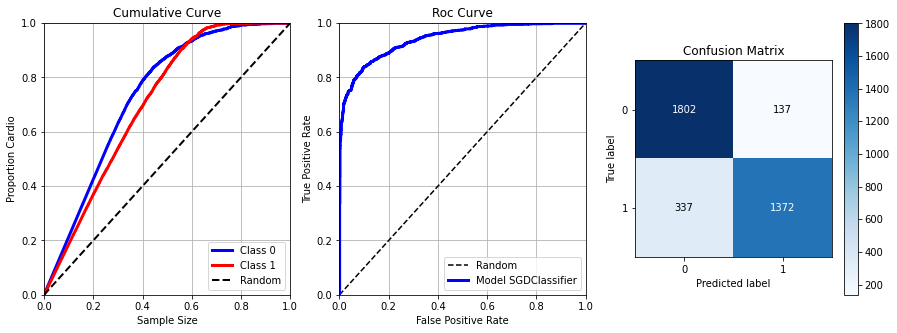

In [61]:
sgd_res = ml_error(type(sgd).__name__, y_valid, yhat_sgd, yhat_sgd_p, True)
sgd_res

#### 8.2.1.2. SMOTETOMEK Dataset

In [25]:
x, x_test, y, y_test = train_test_split(X_st, Y_st, test_size=.10)
x_train, x_valid, y_train, y_valid = train_test_split(x, y, test_size=.10)

In [26]:
sgd = SGDClassifier(loss='log', n_jobs=-1, random_state=33).fit(x_train, y_train)

In [27]:
yhat_sgd = sgd.predict(x_valid)
yhat_sgd_p = sgd.predict_proba(x_valid)

,Model Name,Accuracy,Precision,Kappa Score,ROCAUC,F1-Score
0,SGD,0.739355,0.753296,0.478048,0.738774,0.725689


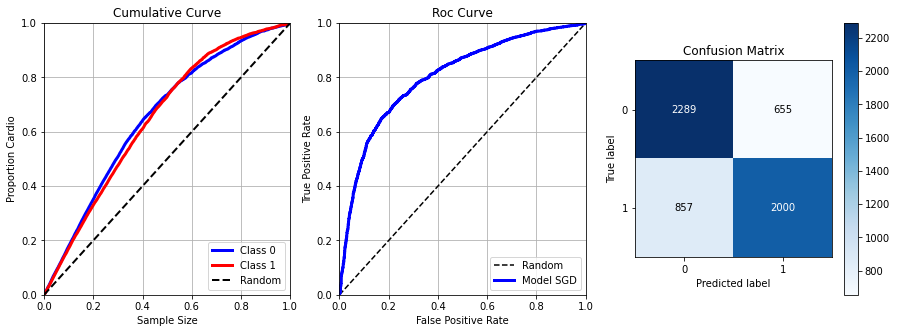

In [28]:
sgd_res = ml_error('SGD', y_valid, yhat_sgd, yhat_sgd_p, True)
sgd_res

### 8.2.2. Ada Boost

#### 8.2.1.1. SMOTEEN Dataset

In [33]:
x, x_test, y, y_test = train_test_split(X_sn, Y_sn, test_size=.10)
x_train, x_valid, y_train, y_valid = train_test_split(x, y, test_size=.10)

In [34]:
ada = AdaBoostClassifier().fit(x_train, y_train)

In [35]:
yhat_ada = ada.predict(x_valid)
yhat_ada_p = ada.predict_proba(x_valid)

,Model Name,Accuracy,Precision,Kappa Score,ROCAUC,F1-Score
0,AdaBoostClassifier,0.873081,0.917394,0.74311,0.868683,0.855086


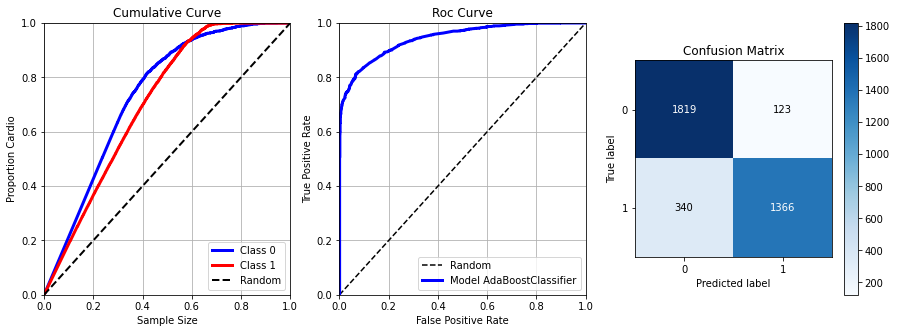

In [38]:
ada_res = ml_error(type(ada).__name__, y_valid, yhat_ada, yhat_ada_p, True)
ada_res

#### 8.2.1.2. SMOTETOMEK Dataset

In [39]:
x, x_test, y, y_test = train_test_split(X_st, Y_st, test_size=.10)
x_train, x_valid, y_train, y_valid = train_test_split(x, y, test_size=.10)

In [40]:
ada = AdaBoostClassifier().fit(x_train, y_train)

In [41]:
yhat_ada = ada.predict(x_valid)
yhat_ada_p = ada.predict_proba(x_valid)

,Model Name,Accuracy,Precision,Kappa Score,ROCAUC,F1-Score
0,AdaBoostClassifier,0.740907,0.791582,0.482962,0.742072,0.722438


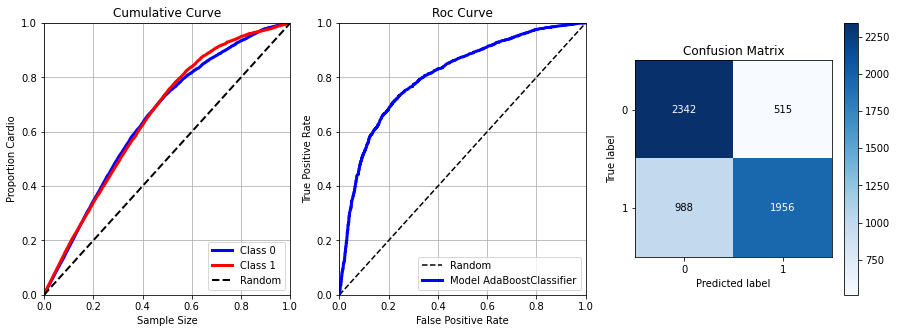

In [42]:
ada_res = ml_error(type(ada).__name__, y_valid, yhat_ada, yhat_ada_p, True)
ada_res

# 9.0. Hyperparameter Tuning (Smoteen Dataset)

In [6]:
x, x_test, y, y_test = train_test_split(X_sn, Y_sn, test_size=.10)
x_train, x_valid, y_train, y_valid = train_test_split(x, y, test_size=.10)

### 9.0.1. SGD Raw

,Model Name,Accuracy,Precision,Kappa Score,ROCAUC,F1-Score
0,SGDClassifier,0.858004,0.872727,0.713703,0.85544,0.843125


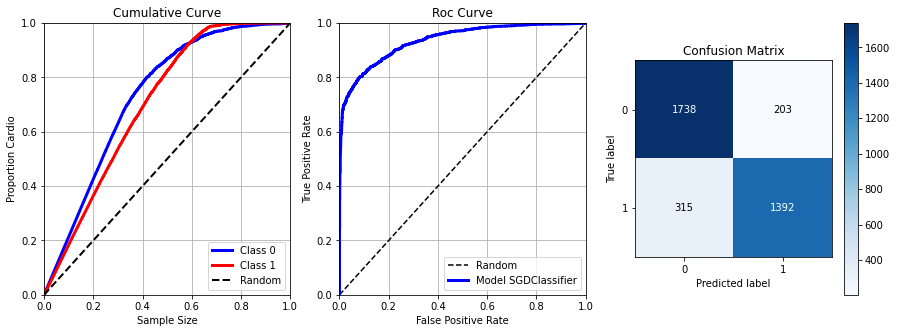

In [9]:
sgd = SGDClassifier(loss="log", n_jobs=-1).fit(x_train, y_train)
yhat_sgd = sgd.predict(x_valid)
yhat_sgd_p = sgd.predict_proba(x_valid)

sgd_res = ml_error(type(sgd).__name__, y_valid, yhat_sgd, yhat_sgd_p, True)
sgd_res

### 9.0.2. Ada Raw

,Model Name,Accuracy,Precision,Kappa Score,ROCAUC,F1-Score
0,AdaBoostClassifier,0.871162,0.909814,0.739404,0.867095,0.853765


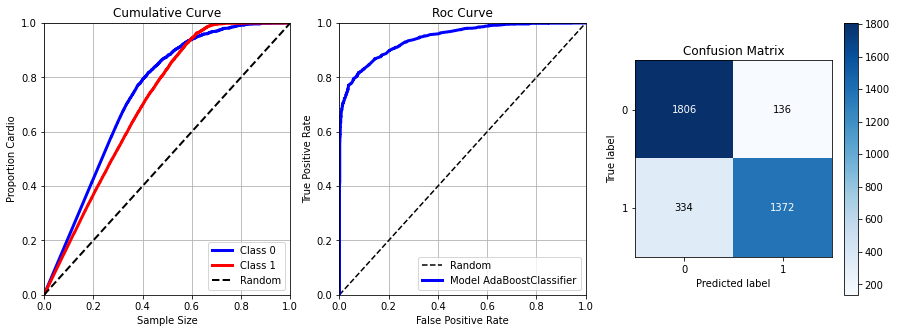

In [48]:
ada = AdaBoostClassifier().fit(x_train, y_train)
yhat_ada = ada.predict(x_valid)
yhat_ada_p = ada.predict_proba(x_valid)

ada_res = ml_error(type(ada).__name__, y_valid, yhat_ada, yhat_ada_p, True)
ada_res

## 9.1. Default Model Cross Validation

In [50]:
df_cv = cross_validation(SGDClassifier(loss="modified_huber", n_jobs=-1), x, pd.Series(y), 10, False)
df_cv

,Model Name,Accuracy,Precision
0,SGDClassifier,0.8618 + / - 0.0124,0.9027 + / - 0.03


In [51]:
df_cv = cross_validation(AdaBoostClassifier(), x, pd.Series(y), 10, False)
df_cv

,Model Name,Accuracy,Precision
0,AdaBoostClassifier,0.8762 + / - 0.0038,0.9172 + / - 0.0075


## 9.2. Random Search Model

### 9.2.1. SGD

In [11]:
h = {'loss'     : ['modified_huber', 'log'],
     'penalty'  : ['l2', 'l1', 'elasticnet'],
     'alpha'    : [.01, .001, 0.0001],
     'l1_ratio' : [.10, .13, .15, .20],
     'max_iter' : [900, 1000, 1500, 2000],
     'epsilon'  : [.07, .1, .15, .2],
     'learning_rate' : ['optimal', 'invscaling', 'constant'],
     'eta0': [.05, .5, 1]}

mean_pre = []
std_pre=[]

for i in range(1000):
    params = {k: choice(v) for k, v in h.items()}
    print(f'\n\n {params}', file=open("tunning.txt", "a"))
    
    random_sgd = SGDClassifier(n_jobs=-1,
                               loss    = params["loss"],
                               penalty = params["penalty"],
                               alpha   = params["alpha"], 
                               l1_ratio = params['l1_ratio'],
                               max_iter = params['max_iter'],
                               epsilon  = params['epsilon'],
                               eta0     = params['eta0'],
                               learning_rate = params['learning_rate'],)

    sgd_results = cross_validation(random_sgd, x, pd.Series(y), 20, False)
    
    print(sgd_results, file=open("tunning.txt", "a"))
    
    mean_pre.append(float(sgd_results.Precision[0][:3]))
    std_pre.append(float(sgd_results.Precision[0][13:]))

### 9.2.2. Ada

In [55]:
h = {'n_estimators'  : [50, 100, 150, 200],
     'learning_rate' : [.5, .7, 1.0, 1.2, 1.4],
     'algorithm'     : ['SAMME.R', 'SAMME']}

mean_pre = []
std_pre = []

for i in range(50):
    params = {k: choice(v) for k, v in h.items()}
    print(f'\n\n {params}', file=open("tunning.txt", "a"))
    
    random_ada = AdaBoostClassifier(n_estimators = params["n_estimators"],
                                    learning_rate= params["learning_rate"],
                                    algorithm    = params["algorithm"])

    ada_results = cross_validation(random_ada, x, pd.Series(y), 5, False)
    
    print(ada_results, file=open("tunning.txt", "a"))
    
    mean_pre.append(float(ada_results.Precision[0][:6]))
    std_pre.append(float(ada_results.Precision[0][13:]))

## 9.3. Tuned Model Cross Validation

### 9.3.1. Tuned SGD

In [114]:
h = {'loss': 'modified_huber', 'penalty': 'l1', 'alpha': 0.01, 'l1_ratio': 0.12, 
     'max_iter': 900, 'epsilon': 0.1, 'learning_rate': 'optimal', 'eta0': 1}


t_sgd = SGDClassifier(n_jobs=-1,
                      loss     = h["loss"],
                      penalty  = h["penalty"],
                      alpha    = h["alpha"], 
                      l1_ratio = h['l1_ratio'],
                      max_iter = h['max_iter'],
                      epsilon  = h['epsilon'],
                      eta0     = h['eta0'],
                      learning_rate = h['learning_rate'])

t_sgd_results = cross_validation(t_sgd, x, pd.Series(y), 20, False)
t_sgd_results

,Model Name,Accuracy,Precision
0,SGDClassifier,0.8644 + / - 0.0079,0.9169 + / - 0.0145


,Model Name,Accuracy,Precision,Kappa Score,ROCAUC,F1-Score
0,SGDClassifier,0.867873,0.926915,0.731638,0.861974,0.845513


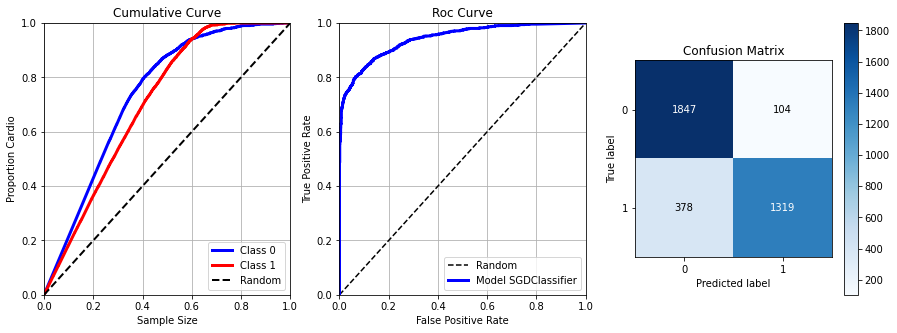

In [115]:
t_sgd = t_sgd.fit(x, y)
yhat_sgd = t_sgd.predict(x_valid)
yhat_sgd_p = t_sgd.predict_proba(x_valid)

sgd_res = ml_error(type(t_sgd).__name__, y_valid, yhat_sgd, yhat_sgd_p, True)
sgd_res

In [116]:
pickle.dump(t_sgd, open('model_sgd.pkl', 'wb'))

### 9.3.2. Tuned Ada

In [51]:
h = {'n_estimators': 100, 'learning_rate': .9, 'algorithm': 'SAMME.R'}

t_ada = AdaBoostClassifier(n_estimators = h["n_estimators"],
                           learning_rate= h["learning_rate"],
                           algorithm    = h["algorithm"])

t_ada_results = cross_validation(t_ada, x, pd.Series(y), 5, False)
t_ada_results

,Model Name,Accuracy,Precision
0,AdaBoostClassifier,0.8757 + / - 0.0021,0.9158 + / - 0.004


,Model Name,Accuracy,Precision,Kappa Score,ROCAUC,F1-Score
0,Ada,0.864583,0.917845,0.726688,0.860908,0.846584


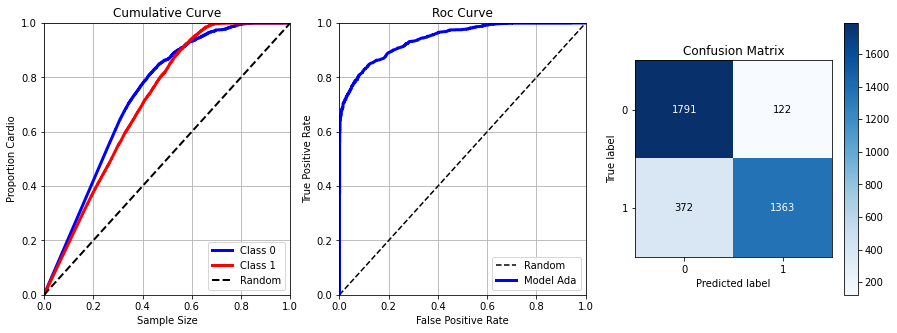

In [53]:
ada = t_ada.fit(x, y)
yhat_ada = ada.predict(x_valid)
yhat_ada_p = ada.predict_proba(x_valid)

ada_res = ml_error('Ada', y_valid, yhat_ada, yhat_ada_p, True)
ada_res

## 9.4. Calibration Curves

### 9.4.1. Setup Calibration

#### 9.4.1.1. Tuned Model

In [118]:
sgd_tuned = pickle.load(open('model_sgd_tuned.pkl', 'rb'))

In [119]:
cv = StratifiedKFold(n_splits=10)

In [120]:
sgd_tuned.fit(x, y);

calibrated_sgd = CalibratedClassifierCV(sgd_tuned, cv=cv, method='sigmoid')
calibrated_sgd.fit(x, np.ravel(y));

yhat_p = sgd_tuned.predict_proba(x_test)
yhat_c_p = calibrated_sgd.predict_proba(x_test)

In [121]:
calibrated_sgd

CalibratedClassifierCV(base_estimator=SGDClassifier(alpha=0.01, eta0=1,
                                                    l1_ratio=0.12,
                                                    loss='modified_huber',
                                                    max_iter=900, n_jobs=-1,
                                                    penalty='l1'),
                       cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False))

#### 9.4.1.2. Perform Calibration

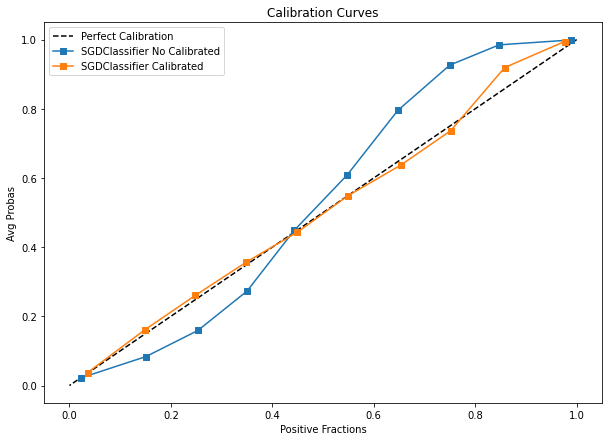

In [122]:
pair_plot_calibration_curve(sgd_tuned, y_test, yhat_p, yhat_c_p)

In [123]:
cross_validation(calibrated_sgd, x, pd.Series(y), 10, False)

,Model Name,Accuracy,Precision
0,CalibratedClassifierCV,0.8665 + / - 0.0041,0.8983 + / - 0.0063


In [124]:
cross_validation(sgd_tuned, x, pd.Series(y), 10, False)

,Model Name,Accuracy,Precision
0,SGDClassifier,0.8653 + / - 0.0062,0.9178 + / - 0.0105


,Model Name,Accuracy,Precision,Kappa Score,ROCAUC,F1-Score
0,SGD Calibrated,0.870614,0.902167,0.73822,0.866647,0.853416


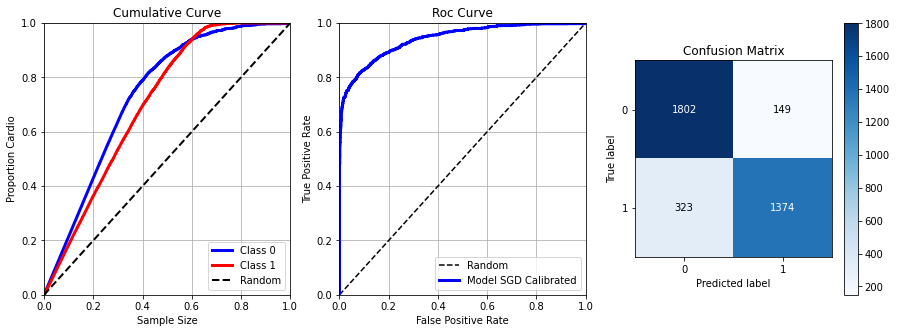

In [125]:
yhat_cali = calibrated_sgd.predict(x_valid)
yhat_cali_p = calibrated_sgd.predict_proba(x_valid)
ml_error("SGD Calibrated", y_valid, yhat_cali, yhat_cali_p, True)

,Model Name,Accuracy,Precision,Kappa Score,ROCAUC,F1-Score
0,SGD Tuned,0.868695,0.949115,0.732614,0.861515,0.843105


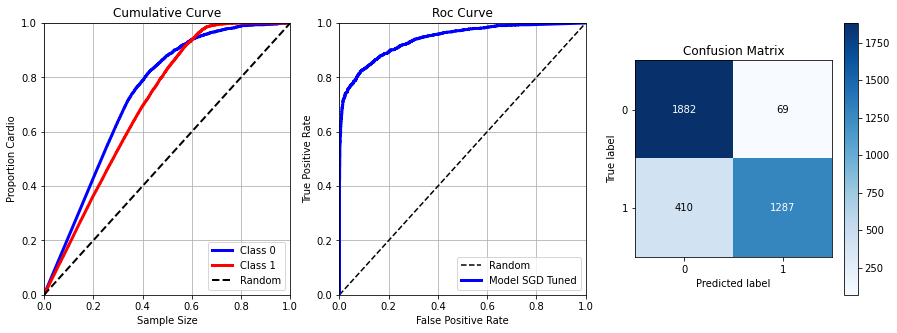

In [126]:
yhat = sgd_tuned.predict(x_valid)
yhat_p = sgd_tuned.predict_proba(x_valid)
ml_error("SGD Tuned", y_valid, yhat, yhat_p, True)

In [127]:
pickle.dump(calibrated_sgd, open('calibrated_sgd.pkl', 'wb'))

#### 9.4.1.3. No Tuned Model

In [45]:
default_sgd = SGDClassifier(loss='log', n_jobs=-1).fit(x, y);

In [46]:
cv = StratifiedKFold(n_splits=10)

In [47]:
calibrated_sgd = CalibratedClassifierCV(default_sgd, cv=cv, method='sigmoid')
calibrated_sgd.fit(x, np.ravel(y));

yhat_p = default_sgd.predict_proba(x_test)
yhat_c_p = calibrated_sgd.predict_proba(x_test)

In [48]:
calibrated_sgd

CalibratedClassifierCV(base_estimator=SGDClassifier(loss='log', n_jobs=-1),
                       cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False))

#### 9.4.1.4. Perform Calibration

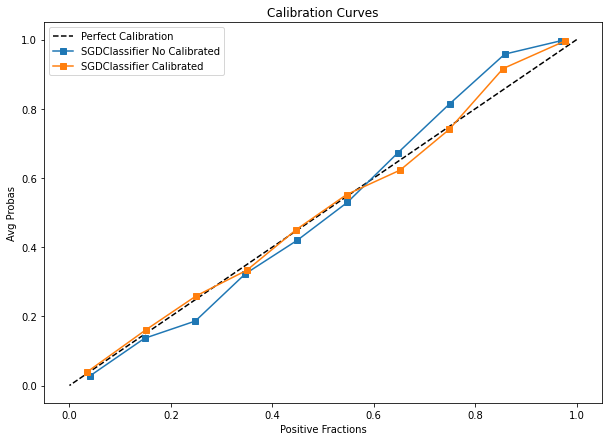

In [50]:
pair_plot_calibration_curve(default_sgd, y_test, yhat_p, yhat_c_p)

In [51]:
cross_validation(calibrated_sgd, x, pd.Series(y), 10, False)

,Model Name,Accuracy,Precision
0,CalibratedClassifierCV,0.8681 + / - 0.0044,0.8973 + / - 0.0061


In [52]:
cross_validation(default_sgd, x, pd.Series(y), 10, False)

,Model Name,Accuracy,Precision
0,SGDClassifier,0.8655 + / - 0.0046,0.9003 + / - 0.0176


,Model Name,Accuracy,Precision,Kappa Score,ROCAUC,F1-Score
0,SGD Calibrated,0.874452,0.907298,0.745965,0.870465,0.857676


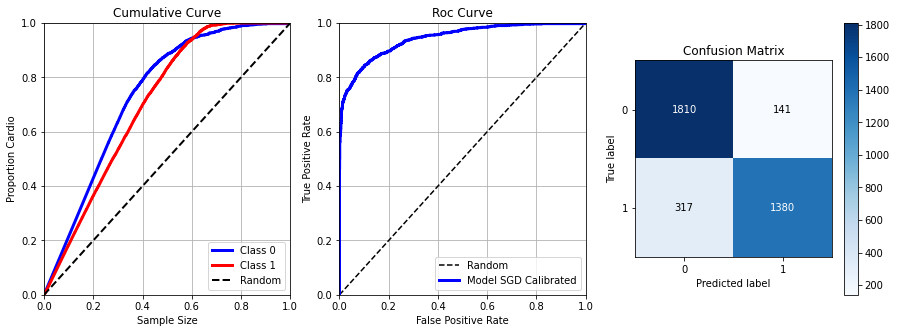

In [53]:
yhat_cali = calibrated_sgd.predict(x_valid)
yhat_cali_p = calibrated_sgd.predict_proba(x_valid)
ml_error("SGD Calibrated", y_valid, yhat_cali, yhat_cali_p, True)

,Model Name,Accuracy,Precision,Kappa Score,ROCAUC,F1-Score
0,SGD Tuned,0.873081,0.904856,0.743222,0.869145,0.856256


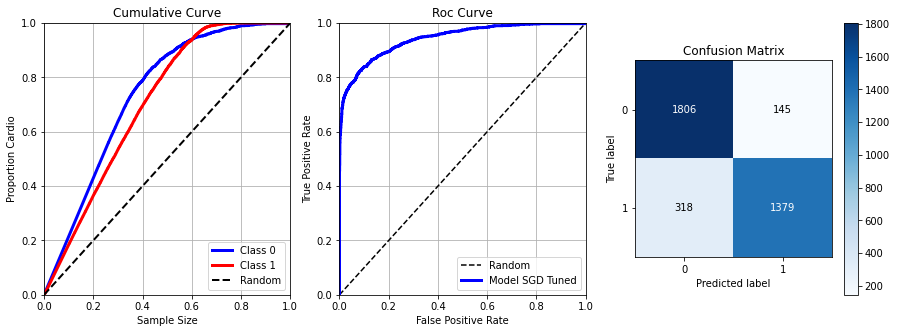

In [54]:
yhat = default_sgd.predict(x_valid)
yhat_p = default_sgd.predict_proba(x_valid)
ml_error("SGD Tuned", y_valid, yhat, yhat_p, True)

In [57]:
pickle.dump(calibrated_sgd, open("calibrated_default_sgd.pkl", "wb"))

## 9.5. Bootstrap Confidence Intervals

In [8]:
x = x.reset_index(drop=True)

In [9]:
x_boot = pd.concat([x, pd.Series(y)], axis=1)
plt.rcParams['font.size'] = 13

### 9.5.1. Calibrated Default SGD

In [10]:
default_sgd_calibrated = pickle.load(open('calibrated_default_sgd.pkl', 'rb'))

In [11]:
stats = perform_bootstrap(1000, x_boot, default_sgd_calibrated, x_test, y_test)

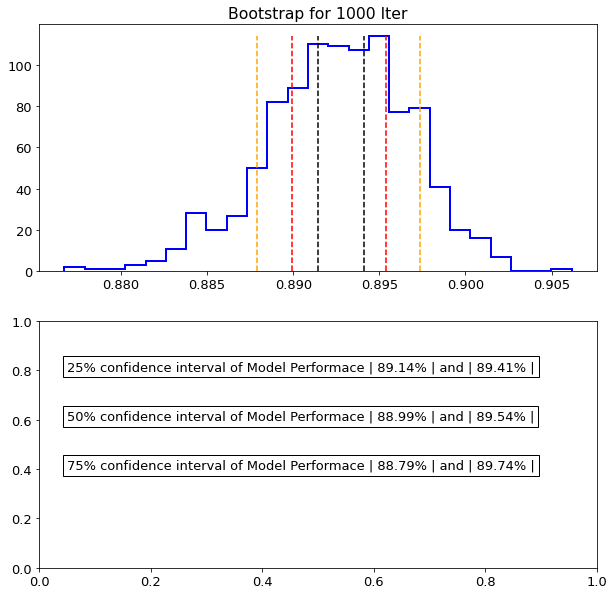

In [12]:
plot_bootstrap_iters(stats)

### 9.5.2. Calibrated Tuned SGD

In [13]:
calibrated_sgd = pickle.load(open('calibrated_sgd.pkl', 'rb'))

In [14]:
stats = perform_bootstrap(1000, x_boot, calibrated_sgd, x_test, y_test)

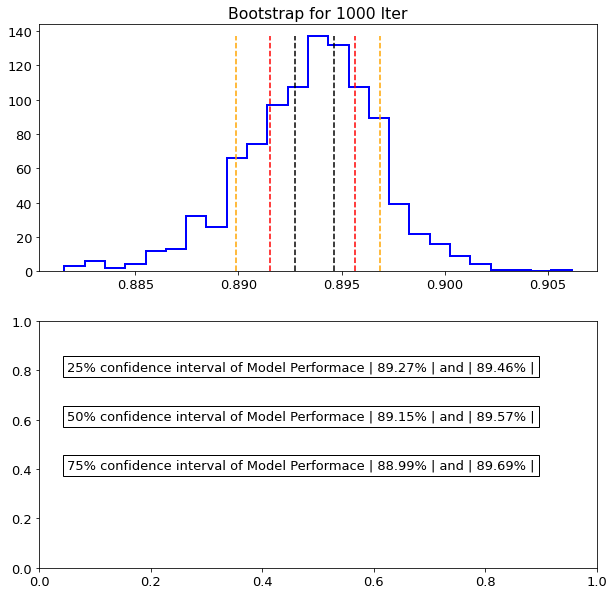

In [15]:
plot_bootstrap_iters(stats)

### 9.5.3. Tuned SGD

In [16]:
sgd_tuned = pickle.load(open('model_sgd_tuned.pkl', 'rb'))

In [17]:
stats = perform_bootstrap(1000, x_boot, sgd_tuned, x_test, y_test)

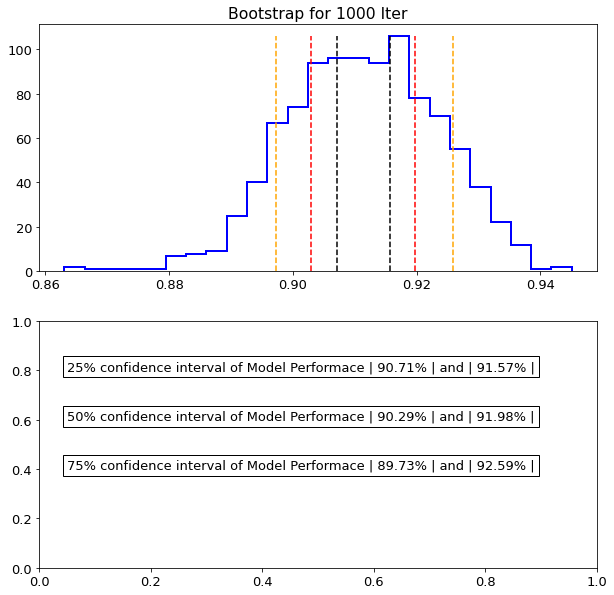

In [18]:
plot_bootstrap_iters(stats)

## 9.6. Final Models

In [139]:
calibrated_sgd = pickle.load(open('calibrated_sgd.pkl', 'rb'))

In [140]:
calibrated_sgd.fit(x, y);

,Model Name,Accuracy,Precision,Kappa Score,ROCAUC,F1-Score
0,CalibratedClassifierCV,0.86035,0.904615,0.71667,0.855068,0.838562


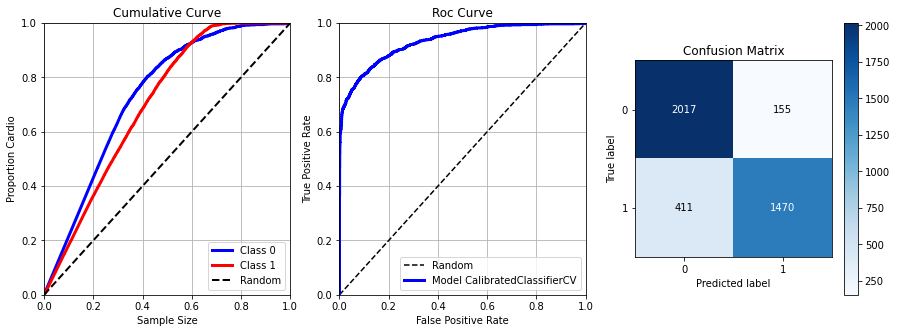

In [141]:
yhat_c = calibrated_sgd.predict(x_test)
yhat_c_p = calibrated_sgd.predict_proba(x_test)
ml_error(type(calibrated_sgd).__name__, y_test, yhat_c, yhat_c_p, True)

In [135]:
sgd_tuned = pickle.load(open('model_sgd_tuned.pkl', 'rb'))

In [136]:
sgd_tuned.fit(x, y);

,Model Name,Accuracy,Precision,Kappa Score,ROCAUC,F1-Score
0,SGDClassifier,0.85887,0.9209,0.712945,0.852334,0.833527


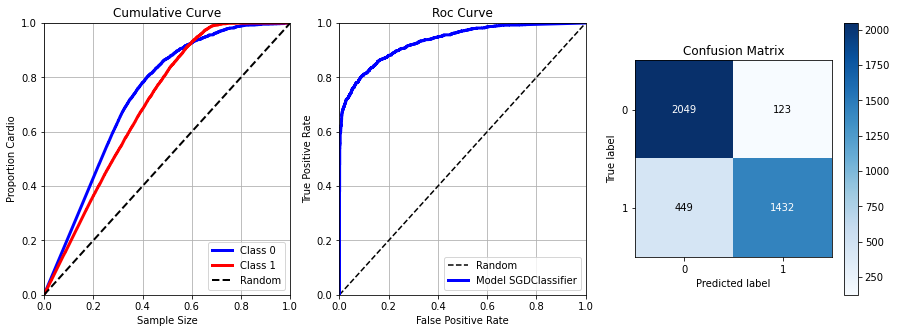

In [137]:
yhat = sgd_tuned.predict(x_test)
yhat_p = sgd_tuned.predict_proba(x_test)
ml_error(type(sgd_tuned).__name__, y_test, yhat, yhat_p, True)

In [25]:
cross_validation(calibrated_sgd, x, pd.Series(y), 20, False)

,Model Name,Accuracy,Precision
0,CalibratedClassifierCV,0.8673 + / - 0.0089,0.9001 + / - 0.0104


In [26]:
cross_validation(sgd_tuned, x, pd.Series(y), 20, False)

,Model Name,Accuracy,Precision
0,SGDClassifier,0.866 + / - 0.0089,0.922 + / - 0.0137


# 10.0. Model Bussiness Performace

**Answering the questions**

> 1. *What is the precision and accuracy of this new tool?*
>
> 2. *How mutch profit the Cardio Catch Diseases will earn with this new tool?*
> 
> 3. *What is the confidence interval of this new tool?*


**1. What is the precision and accuracy of this new tool?**<br>

At Cross Validation Between ( Mean + / - Std )
1. Accuracy  ( 0.866 + / - 0.0089 )
2. Precision ( 0.922 + / - 0.0137 )

**2. How mutch profit the Cardio Catch Diseases will earn with this new tool?**

| Percent | | Money |    | Total Money Base | | Model Performace |
| :-:  |    | :-: |      | :-: |              | :-: |
| 50 % |    | FREE |     | \$ 0  |            | \$ --#-- |
| 55 % |    | \$ 500 |   | \$ 343,530.00 |    | \$ 343,530.00 |
| 60 % |    | \$ 1000 |  | \$ 687,060.00 |    | \$ 687,060.00 |
| 65 % |    | \$ 1500 |  | \$ 1,030,590.00 |  | \$ 1,030,590.00 |
| 70 % |    | \$ 2000 |  | \$ --#-- |         | \$ 1,374,120.00 |
| 75 % |    | \$ 2500 |  | \$ --#-- |         | \$ 1,717,650.00 |
| 80 % |    | \$ 3000 |  | \$ --#-- |         | \$ 2,040,000.00 |



|     |   | Best Scenario |        | Worst Scenario |
| :-: |   | :-: |                  | :-: |
| Model | | +/- \$ 2,040,000.00 |  | +/- \$ 1,374,120.00 |
| Today | | +/- \$ 1,030,590.00 |  | +/- \$ 343,530.00 |

**3. What is the confidence interval of this new tool?**

**25%** confidence interval of Model Performace **( 90.13%  &  91.57% )**<br>
**50%** confidence interval of Model Performace **( 90.29%  &  91.98% )**<br>
**75%** confidence interval of Model Performace **( 89.73%  &  92.59% )**<br>